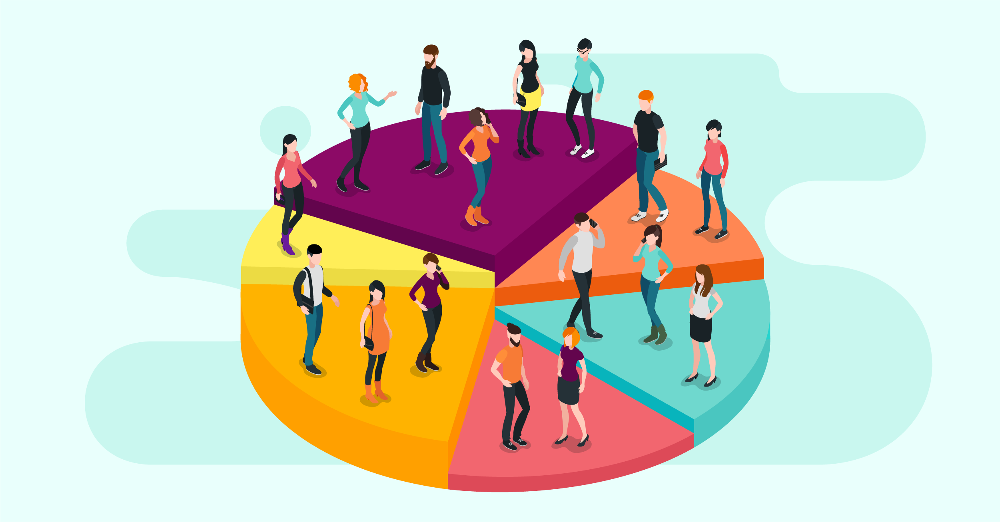

<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:120%; text-align:left">

<h3 align="left"><font color=black>Problem:</font></h3>

<h8 align="left"><font color=black>In this project, based on the personal and purchase behavior data of store customers, we aim to segment customers into different clusters using clustering algorithms like DBSCAN and K-Means. This segmentation helps the store understand and optimize customer relationships, sales strategies, and marketing campaigns.</font></h8>

---

**Completing this project will:**

---

* **Improve Marketing Strategies:**
   * By identifying customer segments, the store can tailor marketing campaigns to the needs and preferences of each cluster, increasing campaign success rates.

* **Enhance Customer Satisfaction:**
   * Understanding customer behavior allows the store to provide personalized recommendations, offers, and products, leading to higher customer satisfaction and loyalty.

* **Boost Sales and Profitability:**
   * By focusing on high-value customer segments and optimizing product offerings, the store can increase revenue and profitability.

* **Optimize Inventory Management:**
   * Insights from customer purchasing habits help the store better predict demand, reducing overstock and stockouts.

* **Facilitate Targeted Campaigns:**
   * By analyzing past campaign responses, the store can design more effective and relevant campaigns for each customer segment, leading to higher acceptance rates.

* **Reduce Operational Costs:**
   * Focusing resources on valuable customer segments helps the store reduce costs associated with ineffective marketing and product management.

---

We are confident that by leveraging clustering algorithms and analyzing customer data, this project will significantly contribute to the store's success, enhancing both its operational efficiency and customer relationships.

</div>


<a id="contents_tabel"></a>    
<div style="border-radius:10px; padding: 15px; background-color:#c4d9cf; font-size:120%; text-align:left">

<h3 align="left"><font color=black>Table of Contents:</font></h3>

* **[Step 1 | Import Libraries](#import)**
* **[Step 2 | Read Dataset](#read)**
* **[Step 3 | Dataset Overview](#overview)**
    - [Step 3.1 | Dataset Basic Information](#basic)
    - [Step 3.2 | Summary Statistics for Continuous Variables](#cat_statistics)
    - [Step 3.3 | Summary Statistics for Categorical Variables](#can_statistics)
* **[Step 4 | EDA](#eda)**
    - [Step 4.1 | Univariate Analysis](#univariate)
    - [Step 4.2 | Bivariate Analysis](#bivariate)
    - [Step 4.3 | Multivariate Analysis](#multivariate)
* **[Step 5 | Data Preprocessing](#preprocessing)**
    - [Step 5.1 | Irrelevant Features Removal](#removal)
    - [Step 5.2 | Outlier Treatment](#outlier)
    - [Step 5.3 | Missing Value Treatment](#missing)
    - [Step 5.4 | Duplicate data Treatment](#duplicate)
    - [Step 5.5 | Feature Transformation](#Transformation)
* **[Step 6 | Feature Engineering](#required)**
    - [Step 6.1 | Convert the "year_birth" column to the person's current age](#grid)    
    - [Step 6.2 | Convert the values of the "Marital_Status" column into two groups: Single and Partner, and encode them](#metrics)        
    - [Step 6.3 | Encode the "Education" Column](#Selection) 
    - [Step 6.4 | Total amount spent by the customer (Total_Spent)](#Cross)
    - [Step 6.5 | Total number of purchases made by the customer (Total_Purchases)](#grid)    
    - [Step 6.6 | Percentage of campaigns accepted by each customer (Acceptance_Rate)](#metrics)        
    - [Step 6.7 | Average monthly purchase amount by the customer (Avg_Monthly_Purchase)](#Selection) 
    
* **[Step 7 | Analysis of data to increase sales in business](#Analysis)**
    - [Step 7.1 | Which type of customers generate the most revenue for the business?](#revenue) 
    - [Step 7.2 | Which products contribute most to sales, and which products are less popular?](#products)
    - [Step 7.3 | What factors drive customers to make repeat purchases?](#factors)
    - [Step 7.4 | Is there a correlation between customer income and their purchasing patterns?](#correlation)
    - [Step 7.5 | Are customers who visit the website more frequently more likely to make purchases?](#website)
    - [Step 7.6 | What characteristics do customers who have accepted campaigns share??](#accepted)
    - [Step 7.7 | Are customers who have been successful in one campaign likely to accept subsequent ones?](#subsequent)
    - [Step 7.8 |  Do customers who purchase more frequently accept campaigns more often?](#frequently)
    - [Step 7.9 |  What factors cause customers to reject campaigns?](#reject)
* **[Step 8 | Deleting columns created in the analysis](#Deleting)**
* **[Step 9 | Feature Scaling](#Scaling)**
* **[Step 10 | Dimensionality Reduction (PCA)](#PCA)**
* **[Step 11 | K_Means Clustering](#KMeans)**
* **[Step 13 | DBSCAN Clustering](#dbscanclustering)**
* **[Step 14 | Recommendation System](#Recommendation)**

<a id="import"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 1: Import Libraries</p>

⬆️[Tabel of Contents](#contents_tabel)

In [1]:
import numpy as np
import pandas as pd
import datetime
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans , DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from yellowbrick.cluster import SilhouetteVisualizer , KElbowVisualizer
import plotly.graph_objects as go
from math import pi
from collections import Counter
from sklearn.neighbors import NearestNeighbors

<a id="import"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 2: Read Dataset</p>

⬆️[Tabel of Contents](#contents_tabel)

In [2]:
data=pd.read_csv("D:/shinetech/marketing_campaign (1).csv", sep='\t')

In [3]:
data

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


<div style="background-color:#c4d9cf;border-radius:10px; padding:20px; font-size:15px">

|       | **Columns**            | **Information**                                                                      |
| :---  | :---                   | :---                                                                                 |      
| **1** | ID                     | Unique identifier for each customer                                                  |                
| **2** | Year_Birth             | Customer's birth year                                                                |                        
| **3** | Education              | Customer's education level                                                           |
| **4** | Marital_Status         | Customer's marital status                                                            |
| **5** | Income                 | Customer's annual income                                                             |                     
| **6** | Kidhome                | Number of young children in the household                                            |
| **7** | Teenhome               | Number of teenagers in the household                                                 |              
| **8** | Dt_Customer            | Date the customer enrolled                                                           |       
| **9** | Recency                | Number of days since the last purchase                                               |
| **10** | MntWines              | Amount spent on wine in the last 2 years                                             |                
| **11** | MntFruits             | Amount spent on fruits in the last 2 years                                           |                        
| **12** | MntMeatProducts       | Amount spent on meat products in the last 2 years                                    |
| **13** | MntFishProducts       | Amount spent on fish products in the last 2 years                                    |
| **14** | MntSweetProducts      | Amount spent on sweet products in the last 2 years                                   |
| **15** | MntGoldProds          | Amount spent on gold products in the last 2 years                                    |                     
| **16** | NumDealsPurchases     | Number of purchases made with a discount                                             |
| **17** | NumWebPurchases       | Number of purchases made through the web                                             |              
| **18** | NumCatalogPurchases   | Number of purchases made using a catalog                                             |       
| **19** | NumStorePurchases     | Number of purchases made directly in stores                                          |
| **20** | NumWebVisitsMonth     | Number of visits to the website per month                                            |                
| **21** | AcceptedCmp3          | Whether the customer accepted Campaign 3                                             |                        
| **22** | AcceptedCmp4          | Whether the customer accepted Campaign 4                                             |
| **23** | AcceptedCmp5          | Whether the customer accepted Campaign 5                                             |
| **24** | AcceptedCmp1          | Whether the customer accepted Campaign 1                                             |
| **25** | AcceptedCmp2          | Whether the customer accepted Campaign 2                                             |                     
| **26** | Complain              | Whether the customer made a complaint                                                |
| **27** | Z_CostContact         | Cost of contacting the customer                                                      |              
| **28** | Z_Revenue             | Revenue from the campaign                                                            |
| **29** | Response              | Whether the customer responded to the campaign                                       |

</div>


<a id="import"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 3: Dataset Overview</p>

⬆️[Tabel of Contents](#contents_tabel)

<a id="basic"></a>
# <b><span style='color:#61756c'>Step 3.1 |</span><span style='color:black'> Dataset Basic Information</span></b>

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

<h2 align="left"><font color=#524712>Information:</font></h2>

* **Missing Value and Object data ,Recognition:**
   - The total data is 2240, so if any column has less than this value, it means there is a missing value in that column..
   - There are 34 missing values in the <b>Income</b> feature.
   - In this dataset, three columns of data are of object type <b>(Education, Marital_Status,  Dt_Customer) </b> and object type data cannot be used in machine learning, so they must be changed in the next steps.

<a id="cat_statistics"></a>
# <b><span style='color:#61756c'>Step 3.2 |</span><span style='color:black'> Identifying discrete and continuous features</span></b>

In [5]:
data.nunique()

ID                     2240
Year_Birth               59
Education                 5
Marital_Status            8
Income                 1974
Kidhome                   3
Teenhome                  3
Dt_Customer             663
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         558
MntFishProducts         182
MntSweetProducts        177
MntGoldProds            213
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Z_CostContact             1
Z_Revenue                 1
Response                  2
dtype: int64

In [6]:
df_categorical=data[['NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response','Kidhome','Teenhome','Education', 'Marital_Status']]

In [7]:
df_categorical.head()

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Kidhome,Teenhome,Education,Marital_Status
0,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0,0,Graduation,Single
1,2,1,1,2,5,0,0,0,0,0,0,3,11,0,1,1,Graduation,Single
2,1,8,2,10,4,0,0,0,0,0,0,3,11,0,0,0,Graduation,Together
3,2,2,0,4,6,0,0,0,0,0,0,3,11,0,1,0,Graduation,Together
4,5,5,3,6,5,0,0,0,0,0,0,3,11,0,1,0,PhD,Married


In [8]:
df_continuous= data.drop(df_categorical,axis=1)

In [9]:
df_continuous.head()

,ID,Year_Birth,Income,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
0,5524,1957,58138.0,04-09-2012,58,635,88,546,172,88,88
1,2174,1954,46344.0,08-03-2014,38,11,1,6,2,1,6
2,4141,1965,71613.0,21-08-2013,26,426,49,127,111,21,42
3,6182,1984,26646.0,10-02-2014,26,11,4,20,10,3,5
4,5324,1981,58293.0,19-01-2014,94,173,43,118,46,27,15


<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:85%; text-align:left">

<h2 align="left"><font color=#524712><b>Dt_Customer</b>:</font></h2>
Because DT is an object and time series, it cannot be plotted here, so we remove the day and month from this column and keep only the year. Now this feature becomes categorical.

In [10]:
df_continuous['Dt_Customer']

0       04-09-2012
1       08-03-2014
2       21-08-2013
3       10-02-2014
4       19-01-2014
           ...    
2235    13-06-2013
2236    10-06-2014
2237    25-01-2014
2238    24-01-2014
2239    15-10-2012
Name: Dt_Customer, Length: 2240, dtype: object

In [11]:
df_categorical['Year'] = pd.to_datetime(df_continuous['Dt_Customer']).dt.year

In [12]:
df_continuous.describe()

,ID,Year_Birth,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,5592.159821,1968.805804,52247.251354,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875
std,3246.662198,11.984069,25173.076661,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2828.250000,1959.000000,35303.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000
50%,5458.500000,1970.000000,51381.500000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000
75%,8427.750000,1977.000000,68522.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000
max,11191.000000,1996.000000,666666.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000


In [13]:
df_continuous=df_continuous.drop('Dt_Customer',axis=1)

In [14]:
df_continuous.head()

,ID,Year_Birth,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
0,5524,1957,58138.0,58,635,88,546,172,88,88
1,2174,1954,46344.0,38,11,1,6,2,1,6
2,4141,1965,71613.0,26,426,49,127,111,21,42
3,6182,1984,26646.0,26,11,4,20,10,3,5
4,5324,1981,58293.0,94,173,43,118,46,27,15


<a id="cat_statistics"></a>
# <b><span style='color:#61756c'>Step 3.3 |</span><span style='color:black'> Summary Statistics for Continuous Variables</span></b>

In [15]:
df_continuous.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.251354,25173.076661,1730.0,35303.00,51381.5,68522.00,666666.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,2240.0,27.062946,41.280498,0.0,1.00,8.0,33.00,263.0
MntGoldProds,2240.0,44.021875,52.167439,0.0,9.00,24.0,56.00,362.0


<a id="can_statistics"></a>
# <b><span style='color:#61756c'>Step 3.4 |</span><span style='color:black'> Summary Statistics for Categorical Variables</span></b>

In [16]:
df_categorical.describe().T

,count,mean,std,min,25%,50%,75%,max
NumDealsPurchases,2240.0,2.325000,1.932238,0.0,1.0,2.0,3.0,15.0
NumWebPurchases,2240.0,4.084821,2.778714,0.0,2.0,4.0,6.0,27.0
NumCatalogPurchases,2240.0,2.662054,2.923101,0.0,0.0,2.0,4.0,28.0
NumStorePurchases,2240.0,5.790179,3.250958,0.0,3.0,5.0,8.0,13.0
NumWebVisitsMonth,2240.0,5.316518,2.426645,0.0,3.0,6.0,7.0,20.0
AcceptedCmp3,2240.0,0.072768,0.259813,0.0,0.0,0.0,0.0,1.0
AcceptedCmp4,2240.0,0.074554,0.262728,0.0,0.0,0.0,0.0,1.0
AcceptedCmp5,2240.0,0.072768,0.259813,0.0,0.0,0.0,0.0,1.0
AcceptedCmp1,2240.0,0.064286,0.245316,0.0,0.0,0.0,0.0,1.0
AcceptedCmp2,2240.0,0.013393,0.114976,0.0,0.0,0.0,0.0,1.0


<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 4: Exploratory Data Analysis (EDA)</p>

⬆️[Tabel of Contents](#contents_tabel)

<a id="basic"></a>
# <b><span style='color:#61756c'>Step 4.1 |</span><span style='color:black'> Categorical Variables Univariate Analysis</span></b>

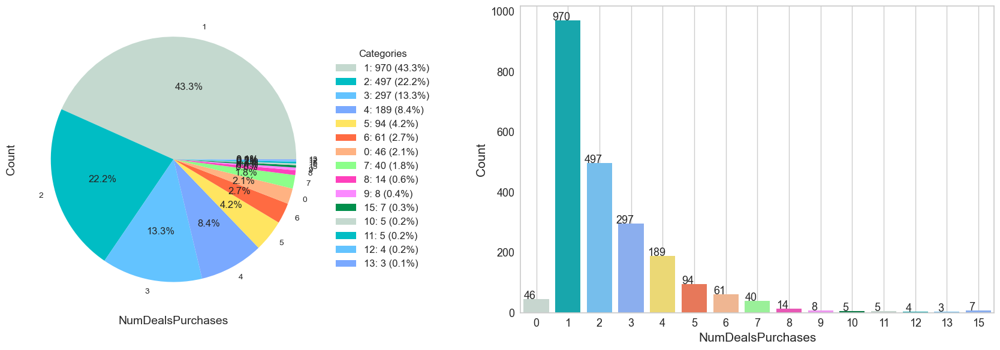

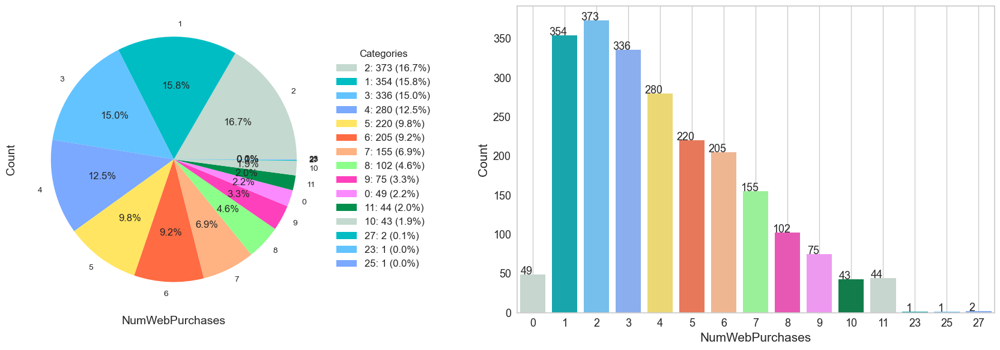

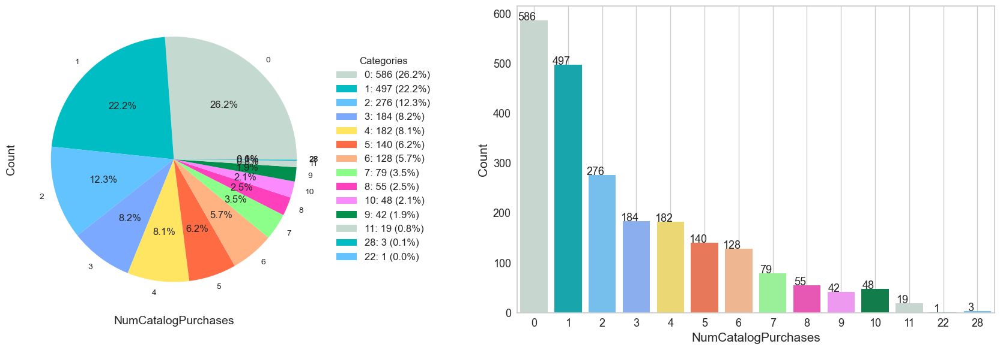

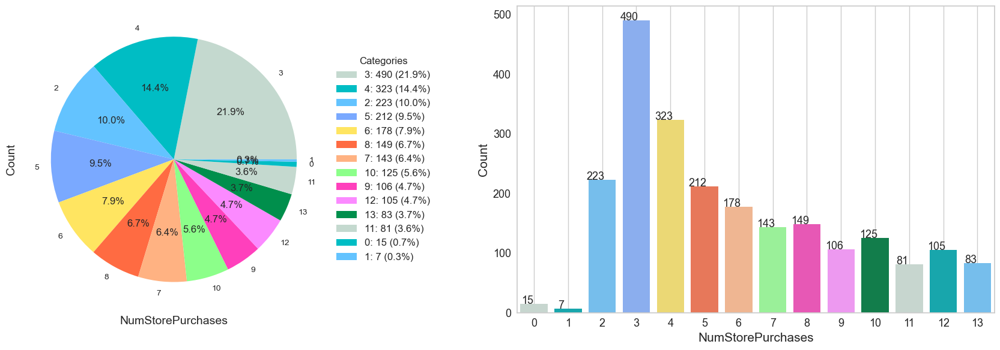

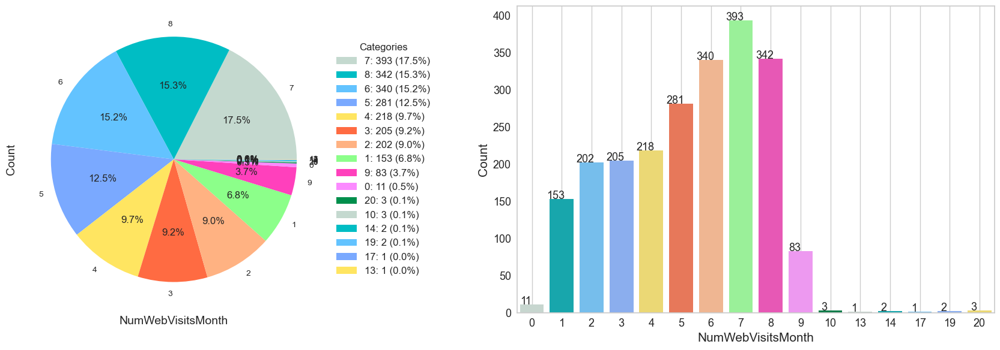

...

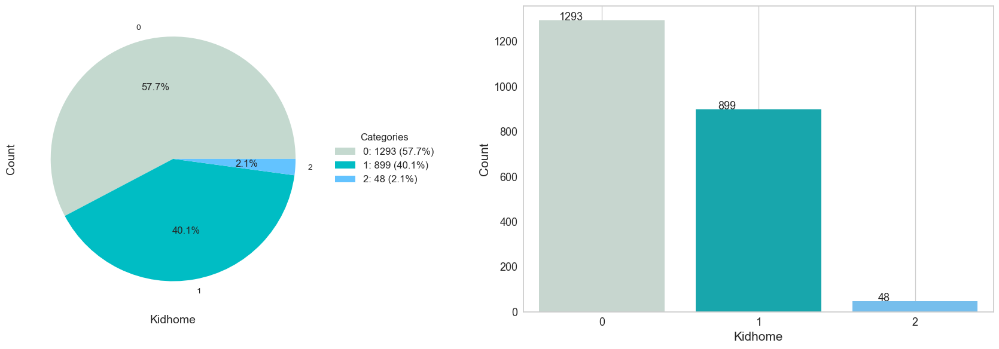

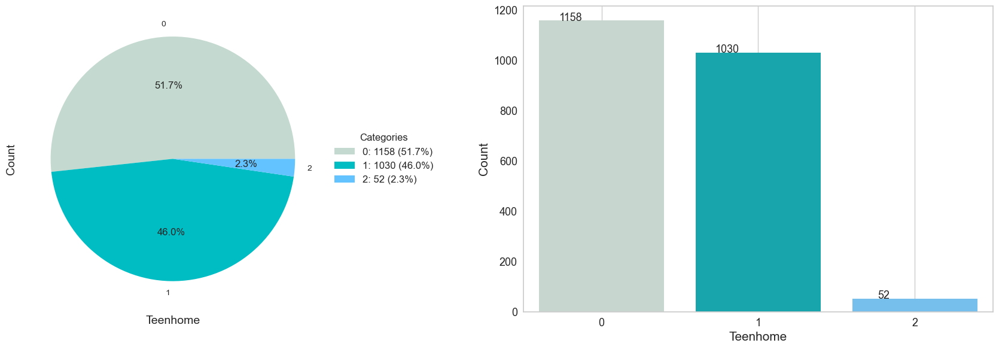

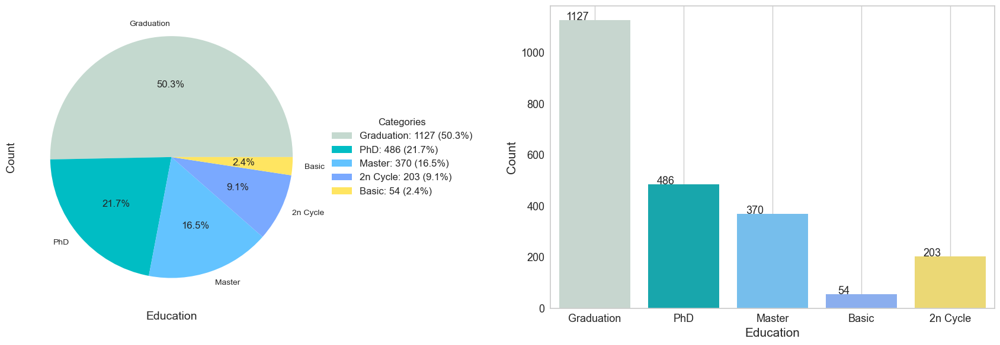

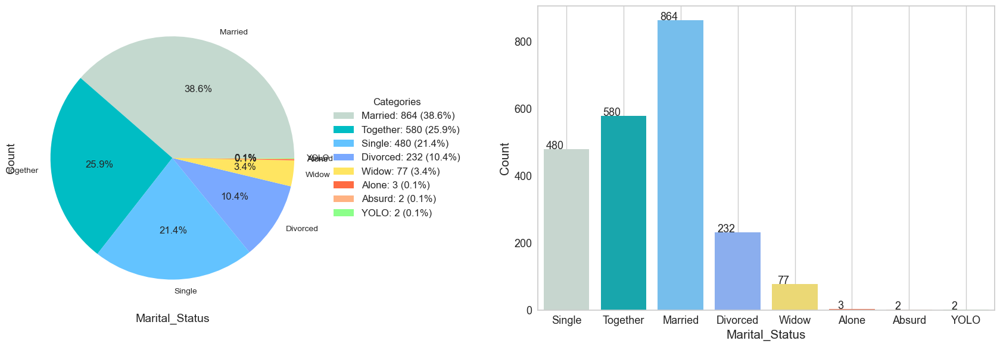

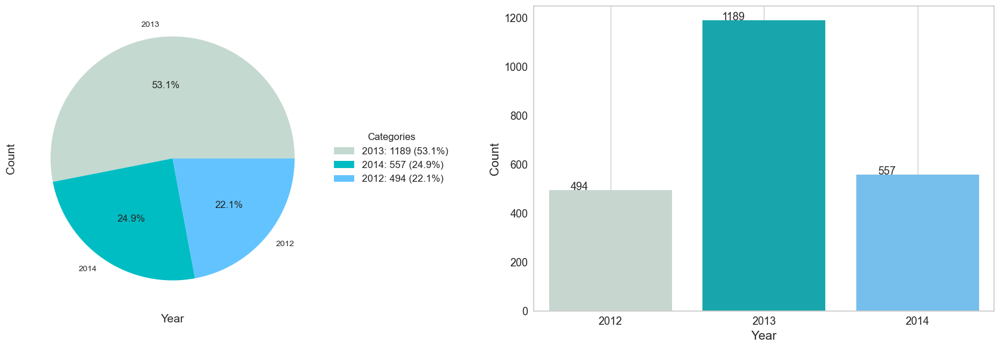

In [17]:
features = df_categorical

for feature in features:
    counts = df_categorical[feature].value_counts()
    percentages = counts / counts.sum() * 100
    colors = ['#c4d9cf','#00bdc4', '#63c3ff','#7aa9ff','#ffe561','#ff6b42', '#ffb282','#8cff8a','#ff40bc','#fb8aff','#008f4c'] 
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    
    # Pie chart
    wedges, _, _ = ax1.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=colors)
    ax1.set_xlabel(feature, fontsize=14)
    ax1.set_ylabel('Count', fontsize=14)
    
    legend_labels = []
    for i, (count, percent) in enumerate(zip(counts, percentages)):
        label = f'{counts.index[i]}: {count} ({percent:.1f}%)'
        legend_labels.append(label)
    
    ax1.legend(wedges, legend_labels, title='Categories', loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12)
    plt.setp(ax1.get_xticklabels(), fontsize=12)
    plt.setp(ax1.get_yticklabels(), fontsize=12)
    
    # Countplot
    ax2 = sns.countplot(x=feature, data=df_categorical, ax=ax2, palette=colors)
    ax2.set_xlabel(feature, fontsize=15)
    ax2.set_ylabel('Count', fontsize=15)
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.grid()
    for p in ax2.patches:
        ax2.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()), ha='center', fontsize=13)
    
    plt.tight_layout()
    plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

<h2 align="left"><font color=#524712>Information:</font></h2>

* **Education:**
   - Most of the customers are university graduates, Ph.D., and Master's respectively, and a few have basic and cycle education.
     
* **Marital_Status:**
   - Married, together, single, widowed, and divorced customers have bought more from the store respectively.
   - The number of categories of this feature can be reduced by merging similar values.
   - Two values Absurd and YOLO have no effect and can be deleted.
     
* **Kidhome:**
   - The number of customers who do not have children is more than those who have one child and very few have two children.
     
* **Teenhome:**
    - The number of customers who do not have teens is more than those who have one teen and very few have two teens.
      
* **NumDealsPurchases:**
   - Some customers have never bought with a discount.
   - Many customers have bought at least once with a discount.   - 
   - 
A fw customerse have bought twice, a few threetimesm.
   - F finally a small numberof customerse have bought with a discountof  up to 15 ti.e.s
  
* **NumWebPurchases:**
   -A large number of customers have bought through the site and a very small number of customers (49 people) have not purchased from the site at all.

* **NumCatalogPurchases:**
   - Too many customers have not bought through the catalog.

* **NumStorePurchases:**
   - 15 customers did not buy directly from the store at all.
   - 7 customers have bought only once by visiting the store.
   - A large number of customers were willing to buy directly from the store.

* **NumWebVisitsMonth:**
   - Most customers have visited the site between 6 and 8 times.

* **AcceptedCmp 1,2,3,4,5:**
   - The majority of customers have not accepted campaigns.

* **Complain:**
   - Very few customers have complained about the store.

* **Z_CostContact:**
   - Because all the values ​​of this feature are the same, it will not help us. 

* **Z_Revenue:**
   - Because all the values ​​of this feature are the same, it will not help us.
     
* **Response:**
   - A very large number of customers did not respond to the campaigns, and their characteristics should be determined so that they are given suggestions based on the characteristics so that they would be willing to respond to the campaigns and increase the store's sales.
     .
* **Year:**
   -Most of the customers joined this store in 2013.ear'

<a id="basic"></a>
# <b><span style='color:#61756c'>Step 4.2 |</span><span style='color:black'> Continuous Variables Univariate Analysis</span></b>

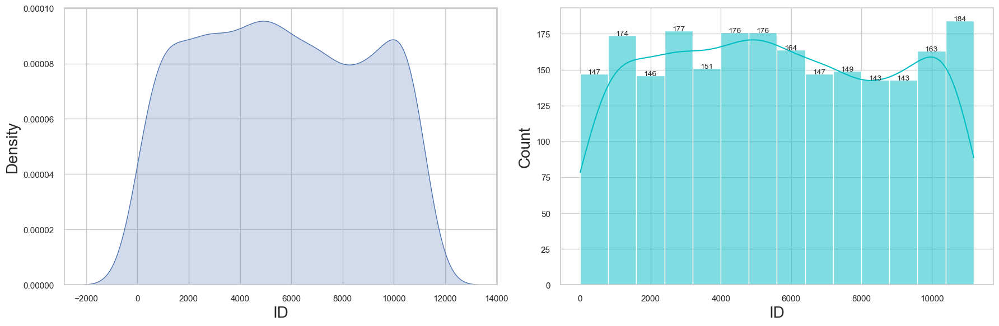

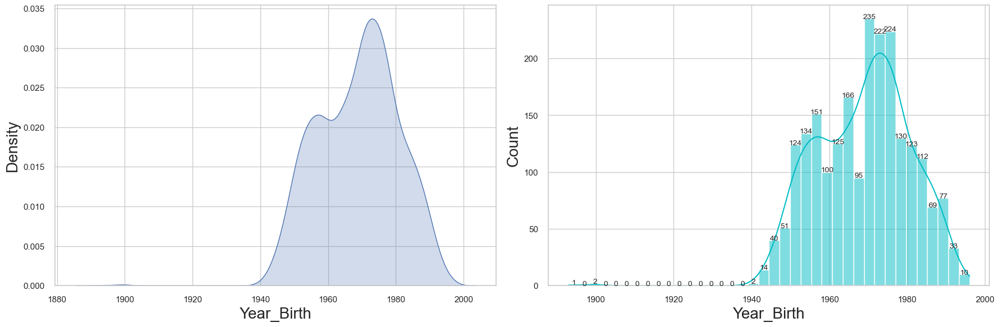

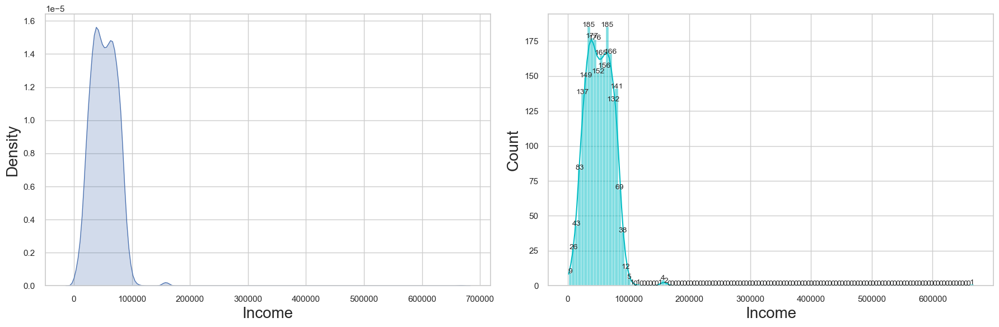

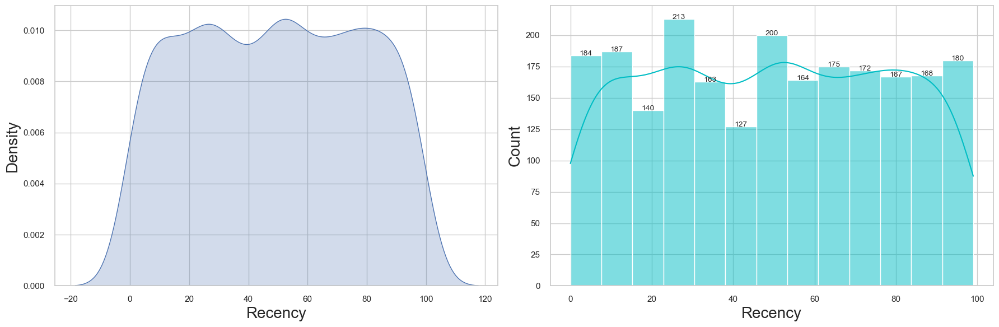

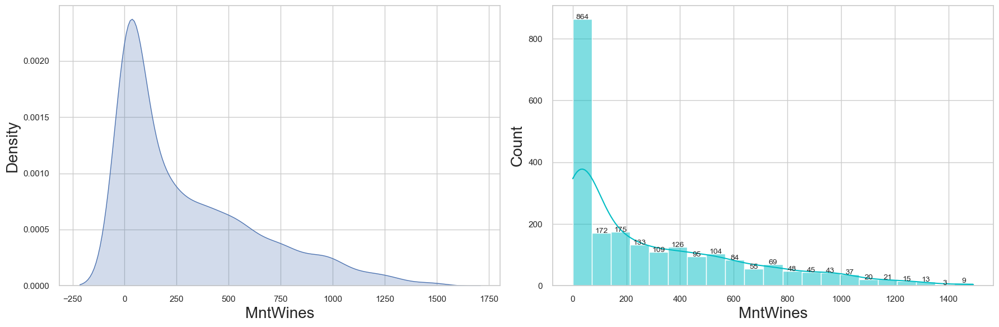

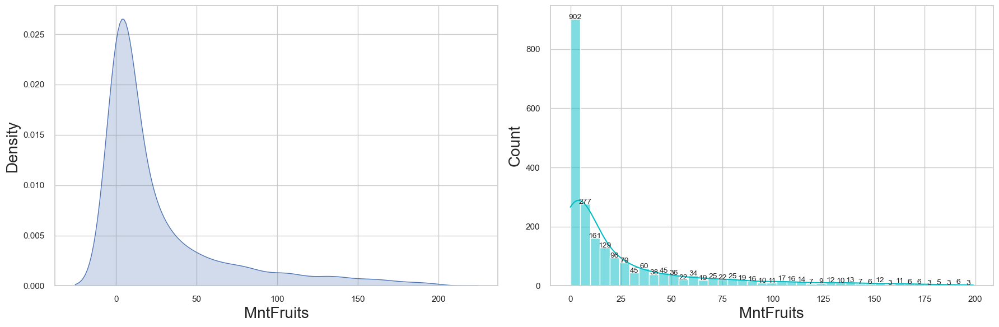

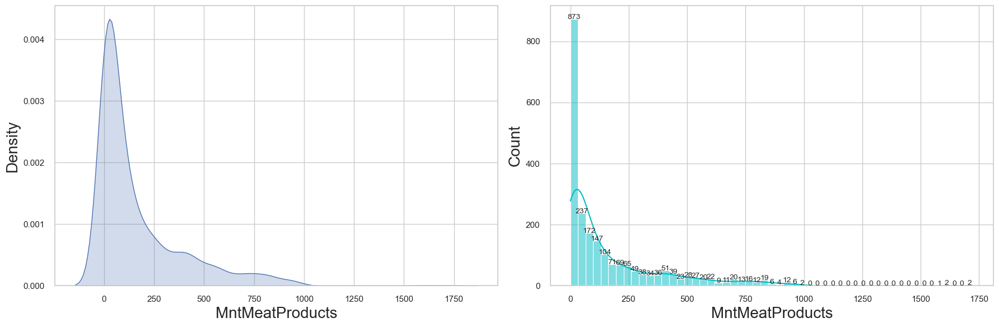

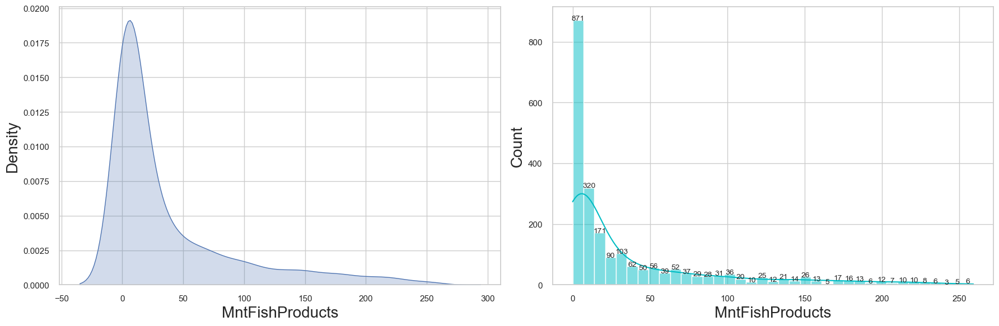

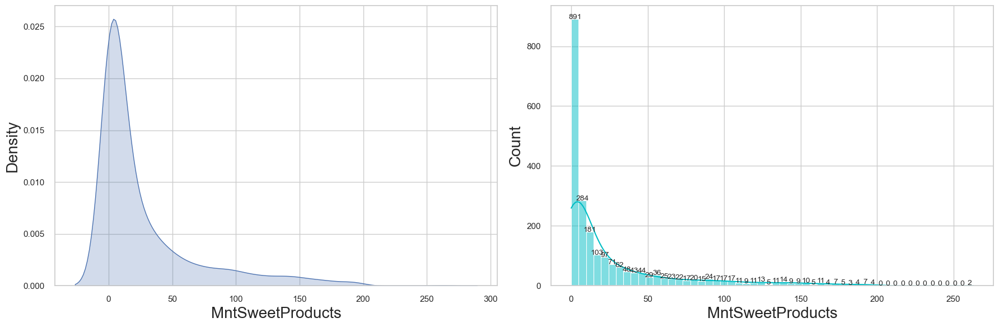

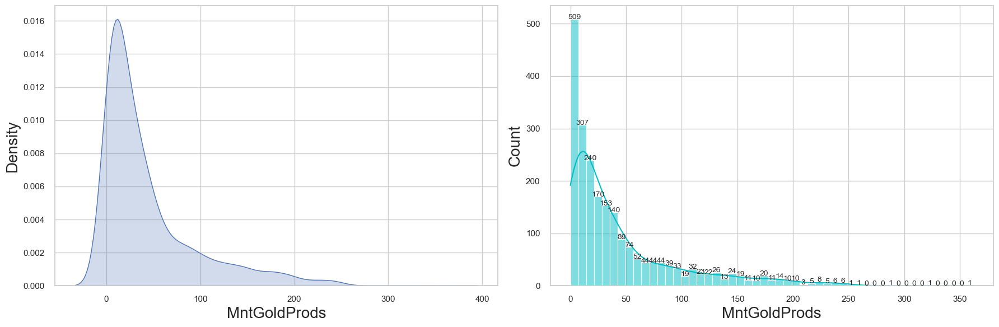

In [18]:
sns.set(style='whitegrid')

cont_cols = df_continuous

for feature in cont_cols:
    sns.set(style='whitegrid')
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    
    # KDE plot
    palette = ['#c4d9cf'] 
    sns.kdeplot(data=df_continuous, x=feature, shade=True, palette=palette, ax=ax1)
    ax1.set_xlabel(feature, fontsize=20)
    ax1.set_ylabel('Density', fontsize=20)
    
    # Histogram plot
    ax2 = sns.histplot(data=df_continuous, x=feature, color='#00bdc4', ax=ax2,kde=True)
    ax2.set_xlabel(feature, fontsize=20)
    ax2.set_ylabel('Count', fontsize=20)
    
    value_counts = data[feature].value_counts()
    for p in ax2.patches:
        ax2.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', fontsize=10)
        ax2.annotate('', (0.5, 0.9), xycoords='axes fraction', ha='center', fontsize=13, color='red')
    
    plt.tight_layout()
    plt.show()

<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 5: Data Preprocessing</p>

⬆️[Tabel of Contents](#contents_tabel)

<a id="removal"></a>
# <b><span style='color:#61756c'>Step 5.1 |</span><span style='color:black'> Irrelevant Feature Removal</span></b>

<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

<h2 align="left"><font color=black>Information:</font></h2>

   - The **Z_Revenue and Z_CostContact features** do not hold any meaningful value for our modeling purposes, so we will remove them.

In [19]:
df_continuous.head()

,ID,Year_Birth,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
0,5524,1957,58138.0,58,635,88,546,172,88,88
1,2174,1954,46344.0,38,11,1,6,2,1,6
2,4141,1965,71613.0,26,426,49,127,111,21,42
3,6182,1984,26646.0,26,11,4,20,10,3,5
4,5324,1981,58293.0,94,173,43,118,46,27,15


In [20]:
df_categorical=df_categorical.drop(['Z_Revenue','Z_CostContact'],axis=1)

In [21]:
df_categorical.head()

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Kidhome,Teenhome,Education,Marital_Status,Year
0,3,8,10,4,7,0,0,0,0,0,0,1,0,0,Graduation,Single,2012
1,2,1,1,2,5,0,0,0,0,0,0,0,1,1,Graduation,Single,2014
2,1,8,2,10,4,0,0,0,0,0,0,0,0,0,Graduation,Together,2013
3,2,2,0,4,6,0,0,0,0,0,0,0,1,0,Graduation,Together,2014
4,5,5,3,6,5,0,0,0,0,0,0,0,1,0,PhD,Married,2014


<a id="outlier"></a>
# <b><span style='color:#61756c'>Step 5.2 |</span><span style='color:black'> Outlier Treatment</span></b>

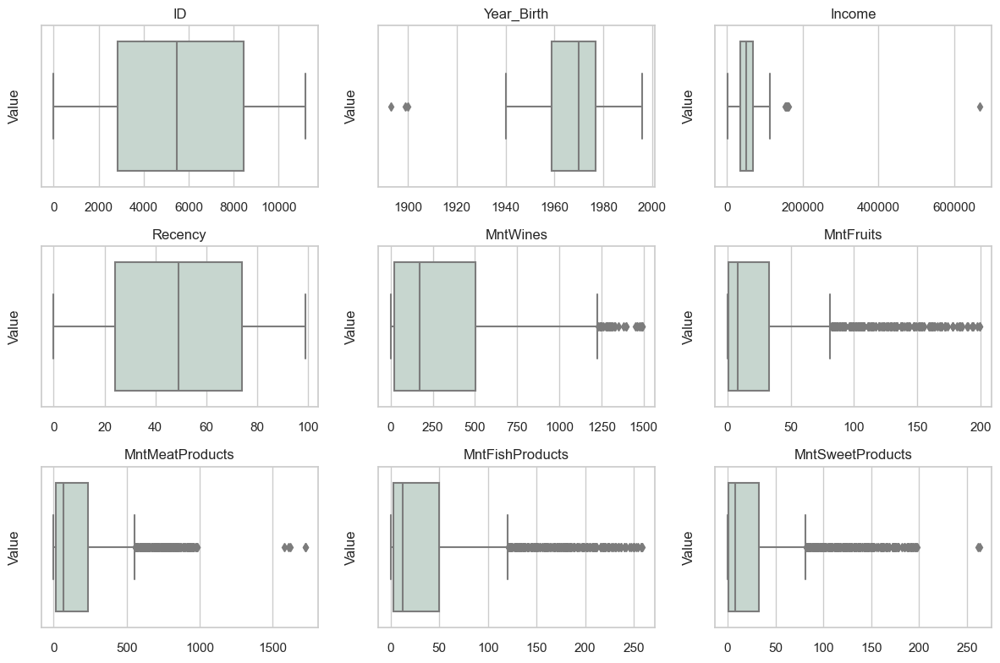

In [22]:
num_cols = 3
num_rows = 3
num_features = len(df_continuous.columns)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))
feature_num = 0

for i in range(num_rows):
    for j in range(num_cols):
        if feature_num < num_features:
            sns.boxplot(x=df_continuous.iloc[:, feature_num], color='#c4d9cf', ax=axes[i, j])
            axes[i, j].set_title(df_continuous.columns[feature_num])
            axes[i, j].set_ylabel('Value')
            axes[i, j].set_xlabel('')
            feature_num += 1
        else:
            axes[i, j].axis('off') 

plt.tight_layout()  
plt.show() 

In [23]:
df_continuous=df_continuous[df_continuous['Year_Birth']>1920]
df_continuous=df_continuous[df_continuous['Income']<500000]

<a id="missing"></a>
# <b><span style='color:#61756c'>Step 5.3 |</span><span style='color:black'> Missing Value Treatment</span></b>

In [24]:
df_continuous.isnull().sum()

ID                  0
Year_Birth          0
Income              0
Recency             0
MntWines            0
MntFruits           0
MntMeatProducts     0
MntFishProducts     0
MntSweetProducts    0
MntGoldProds        0
dtype: int64

In [25]:
df_categorical.isnull().sum()

NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Response               0
Kidhome                0
Teenhome               0
Education              0
Marital_Status         0
Year                   0
dtype: int64

<a id="duplicate"></a>
# <b><span style='color:#61756c'>Step 5.4 |</span><span style='color:black'> Duplicate data Treatment</span></b>

In [26]:
duplicate_rows = df_categorical[df_categorical.duplicated(keep=False)]


duplicate_rows_sorted = duplicate_rows.sort_values(by=['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Response', 'Kidhome', 'Teenhome', 'Education',
       'Marital_Status', 'Year'])

duplicate_rows_sorted

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Kidhome,Teenhome,Education,Marital_Status,Year
1526,0,4,6,7,1,0,0,0,0,0,0,0,0,0,PhD,Widow,2014
2217,0,4,6,7,1,0,0,0,0,0,0,0,0,0,PhD,Widow,2014
650,0,4,6,9,1,0,1,0,0,0,0,0,0,0,Master,Single,2014
1113,0,4,6,9,1,0,1,0,0,0,0,0,0,0,Master,Single,2014
1100,0,4,7,6,1,1,0,1,1,0,0,1,0,0,Graduation,Divorced,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1480,7,10,2,12,7,0,0,0,0,0,0,0,0,1,Graduation,Single,2013
230,9,5,1,8,7,0,0,0,0,0,0,1,1,1,Graduation,Single,2013
1803,9,5,1,8,7,0,0,0,0,0,0,1,1,1,Graduation,Single,2013
1147,12,9,2,8,8,0,0,0,0,0,0,0,1,1,Graduation,Together,2012


In [27]:
ID=df_continuous['ID']

In [28]:
ID

0        5524
1        2174
2        4141
3        6182
4        5324
        ...  
2235    10870
2236     4001
2237     7270
2238     8235
2239     9405
Name: ID, Length: 2212, dtype: int64

In [29]:
df_continuous=df_continuous.drop('ID',axis=1)

In [30]:
duplicate_rows = df_continuous[df_continuous.duplicated(keep=False)]

duplicate_rows_sorted = duplicate_rows.sort_values(by=['Year_Birth', 'Income', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts','MntGoldProds'])

duplicate_rows_sorted

,Year_Birth,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
39,1943,48948.0,53,437,8,206,160,49,42
894,1943,48948.0,53,437,8,206,160,49,42
17,1946,37760.0,20,84,5,38,150,12,28
282,1946,37760.0,20,84,5,38,150,12,28
393,1946,51012.0,86,102,9,63,2,9,24
...,...,...,...,...,...,...,...,...,...
1578,1992,34935.0,71,34,4,66,3,10,20
392,1993,74293.0,66,375,152,335,93,91,81
928,1993,74293.0,66,375,152,335,93,91,81
696,1995,34824.0,65,4,2,11,2,0,4


In [31]:
duplicate_indices = df_continuous[df_continuous.duplicated(keep='first')].index

In [32]:
duplicate_indices

Int64Index([  83,  179,  281,  282,  363,  383,  408,  421,  443,  463,
            ...
            2193, 2202, 2204, 2216, 2217, 2218, 2221, 2225, 2234, 2236],
           dtype='int64', length=205)

In [33]:
df_continuous=df_continuous.drop_duplicates()

In [34]:
len(df_continuous)

2007

In [35]:
cleaned_ids = ID.drop(index=duplicate_indices).reset_index(drop=True)

In [36]:
cleaned_ids

0        5524
1        2174
2        4141
3        6182
4        5324
        ...  
2002     8080
2003    10870
2004     7270
2005     8235
2006     9405
Name: ID, Length: 2007, dtype: int64

In [37]:
df_categorical=df_categorical.drop_duplicates()

In [38]:
len(df_categorical)

2012

<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 6: Feature Engineering</p>

⬆️[Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

<h2 align="left"><font color=#524712>Tasks to be performed:</font></h2>

* **Phase 1:**
   - Convert the "year_birth" column to the person's current age.
   - Convert the values of the "Marital_Status" column into two groups: Single and Partner, and encode them.
   - Encode the "Education" column.
* **Phase 2: Engineer and create new data columns that contain important information and are suitable for our clustering** 
* **New features:**
   - Total number of purchases made by the customer (Total_Purchases)
   - Total amount spent by the customer (Total_Spent)
   - Percentage of campaigns accepted by each customer (Acceptance_Rate)
   - Average monthly purchase amount by the customer (Avg_Monthly_Purchase)

<a id="removal"></a>
# <b><span style='color:#61756c'>Step 6.1 |</span><span style='color:black'> Convert the "year_birth" column to the person's current age.</span></b>

In [39]:
df_continuous['Age']=2014-df_continuous['Year_Birth']
df_continuous=df_continuous.drop("Year_Birth",axis=1)

In [40]:
df_continuous.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age
0,58138.0,58,635,88,546,172,88,88,57
1,46344.0,38,11,1,6,2,1,6,60
2,71613.0,26,426,49,127,111,21,42,49
3,26646.0,26,11,4,20,10,3,5,30
4,58293.0,94,173,43,118,46,27,15,33


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 6.2 |</span><span style='color:black'> Convert the values of the "Marital_Status" column into two groups: Single and Partner, and encode them.</span></b>

In [41]:
df_categorical["Marital_Status_new"]=df_categorical["Marital_Status"].replace({"Married":"Partner", "Together":"Partner", "Absurd":"Single", "Widow":"Single", "YOLO":"Single", "Divorced":"Single"})
df_categorical=df_categorical.drop("Marital_Status",axis=1)

In [42]:
df_categorical.head()

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Kidhome,Teenhome,Education,Year,Marital_Status_new
0,3,8,10,4,7,0,0,0,0,0,0,1,0,0,Graduation,2012,Single
1,2,1,1,2,5,0,0,0,0,0,0,0,1,1,Graduation,2014,Single
2,1,8,2,10,4,0,0,0,0,0,0,0,0,0,Graduation,2013,Partner
3,2,2,0,4,6,0,0,0,0,0,0,0,1,0,Graduation,2014,Partner
4,5,5,3,6,5,0,0,0,0,0,0,0,1,0,PhD,2014,Partner


In [43]:
CatCols = ['Marital_Status_new']

df_categorical = pd.get_dummies(df_categorical, columns=CatCols, drop_first=True)
df_categorical.head(5)

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Kidhome,Teenhome,Education,Year,Marital_Status_new_Partner,Marital_Status_new_Single
0,3,8,10,4,7,0,0,0,0,0,0,1,0,0,Graduation,2012,0,1
1,2,1,1,2,5,0,0,0,0,0,0,0,1,1,Graduation,2014,0,1
2,1,8,2,10,4,0,0,0,0,0,0,0,0,0,Graduation,2013,1,0
3,2,2,0,4,6,0,0,0,0,0,0,0,1,0,Graduation,2014,1,0
4,5,5,3,6,5,0,0,0,0,0,0,0,1,0,PhD,2014,1,0


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 6.3 |</span><span style='color:black'> Encode the "Education" column </span></b>

In [44]:
df_categorical['Education']

0       Graduation
1       Graduation
2       Graduation
3       Graduation
4              PhD
           ...    
2233    Graduation
2235    Graduation
2237    Graduation
2238        Master
2239           PhD
Name: Education, Length: 2012, dtype: object

In [45]:
CatCols = ['Education']

df_categorical = pd.get_dummies(df_categorical, columns=CatCols, drop_first=True)
df_categorical.head(5)

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,...,Response,Kidhome,Teenhome,Year,Marital_Status_new_Partner,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD
0,3,8,10,4,7,0,0,0,0,0,...,1,0,0,2012,0,1,0,1,0,0
1,2,1,1,2,5,0,0,0,0,0,...,0,1,1,2014,0,1,0,1,0,0
2,1,8,2,10,4,0,0,0,0,0,...,0,0,0,2013,1,0,0,1,0,0
3,2,2,0,4,6,0,0,0,0,0,...,0,1,0,2014,1,0,0,1,0,0
4,5,5,3,6,5,0,0,0,0,0,...,0,1,0,2014,1,0,0,0,0,1


<div style="border-radius:10px; padding: 20px; background-color: #c4d9cf; font-size:100%; text-align:left">

<h3 align="left"><font color=black>Creating new feature:</font></h3>
    
<b>Total_Spent:</b>
<h8 align="left"><font color=black></font></br>Here is a new feature called Total_Spent of the total cost that a customer has spent to buy from this store. We can determine how much each customer can help our business with this.</font></h8>

</br><b>Total_Purchases:</b>
<h8 align="left"><font color=black></font></br>To create this feature, the Sum of the following features(NumDealsPurchases, NumWebPurchases, NumCatalogPurchases, NumStorePurchases) must be calculated.</font></h8>    
</br><b>Acceptance_Rate_Cmp:</b>
<h8 align="left"><font color=black></font></br>It shows the number of campaigns accepted by the customer in percentage (two decimal places). </font></h8>   
</br><b>Avg_Monthly_Purchase:</b>
<h8 align="left"><font color=black></font></br>This feature calculates the average monthly purchases of customers in these two years. </font></h8> 

<a id="removal"></a>
# <b><span style='color:#61756c'>Step 6.4 |</span><span style='color:black'> Total amount spent by the customer (Total_Spent) </span></b>

In [46]:
df_continuous['Total_Spent'] = df_continuous['MntWines'] + df_continuous['MntFruits'] + df_continuous['MntMeatProducts'] + df_continuous['MntFishProducts'] + df_continuous['MntSweetProducts'] + df_continuous['MntGoldProds']

In [47]:
df_continuous.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age,Total_Spent
0,58138.0,58,635,88,546,172,88,88,57,1617
1,46344.0,38,11,1,6,2,1,6,60,27
2,71613.0,26,426,49,127,111,21,42,49,776
3,26646.0,26,11,4,20,10,3,5,30,53
4,58293.0,94,173,43,118,46,27,15,33,422


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 6.5 |</span><span style='color:black'> Total number of purchases made by the customer (Total_Purchases) </span></b>

In [48]:
df_categorical['Total_Purchases'] = (df_categorical['NumDealsPurchases'] + df_categorical['NumWebPurchases'] + df_categorical['NumCatalogPurchases'] + df_categorical['NumStorePurchases'])

In [49]:
df_categorical.head()

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,...,Kidhome,Teenhome,Year,Marital_Status_new_Partner,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Total_Purchases
0,3,8,10,4,7,0,0,0,0,0,...,0,0,2012,0,1,0,1,0,0,25
1,2,1,1,2,5,0,0,0,0,0,...,1,1,2014,0,1,0,1,0,0,6
2,1,8,2,10,4,0,0,0,0,0,...,0,0,2013,1,0,0,1,0,0,21
3,2,2,0,4,6,0,0,0,0,0,...,1,0,2014,1,0,0,1,0,0,8
4,5,5,3,6,5,0,0,0,0,0,...,1,0,2014,1,0,0,0,0,1,19


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 6.6 |</span><span style='color:black'> Percentage of campaigns accepted by each customer (Acceptance_Rate) </span></b>

In [50]:
df_categorical['Acceptance_Rate_Cmp'] = (df_categorical[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']].sum(axis=1)) / 5

In [51]:
df_categorical.head()

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,...,Teenhome,Year,Marital_Status_new_Partner,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Total_Purchases,Acceptance_Rate_Cmp
0,3,8,10,4,7,0,0,0,0,0,...,0,2012,0,1,0,1,0,0,25,0.0
1,2,1,1,2,5,0,0,0,0,0,...,1,2014,0,1,0,1,0,0,6,0.0
2,1,8,2,10,4,0,0,0,0,0,...,0,2013,1,0,0,1,0,0,21,0.0
3,2,2,0,4,6,0,0,0,0,0,...,0,2014,1,0,0,1,0,0,8,0.0
4,5,5,3,6,5,0,0,0,0,0,...,0,2014,1,0,0,0,0,1,19,0.0


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 6.7 |</span><span style='color:black'> Average monthly purchase amount by the customer (Avg_Monthly_Purchase) </span></b>

In [52]:
df_continuous['Avg_Monthly_Purchase'] = df_continuous['Total_Spent'] / 24

In [53]:
df_continuous.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age,Total_Spent,Avg_Monthly_Purchase
0,58138.0,58,635,88,546,172,88,88,57,1617,67.375000
1,46344.0,38,11,1,6,2,1,6,60,27,1.125000
2,71613.0,26,426,49,127,111,21,42,49,776,32.333333
3,26646.0,26,11,4,20,10,3,5,30,53,2.208333
4,58293.0,94,173,43,118,46,27,15,33,422,17.583333


<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 7: Analysis of data to increase sales in business </p>

⬆️[Tabel of Contents](#contents_tabel)

<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

<h2 align="left"><font color=Red>A business manager aiming to boost sales and improve campaign acceptance rates might ponder the following questions. These inquiries can be answered through data analysis, enabling the manager to optimize their sales strategies:</font></h2>

* **Questions related to increasing sales:**
   - **1: Which customer segments generate the most revenue for the business?** 
Goal: Focus on retaining and increasing engagement with these customers.
   - 2: **Which products contribute most to sales, and which products are less popular?**
Goal: Expand and promote top-selling products further, while reviewing or improving underperforming ones.
   - 3: **What factors drive customers to make repeat purchases?**
Goal: Create loyalty programs or special offers for this group.
   - 4: **Is there a correlation between customer income and their purchasing patterns?**
Goal: Develop pricing strategies and suitable offers for each income level.
   - 5: **Are customers who visit the website more frequently more likely to make purchases?**
Goal: Optimize the website user experience to increase online purchases.
* **Questions related to improving campaign acceptance rates:**
   - 1: **What characteristics do customers who have accepted campaigns share?**
Goal: Design personalized campaigns for customer groups with similar traits.
   - 2: **Are customers who have been successful in one campaign likely to accept subsequent ones?**
Goal: Create follow-up strategies for customers who have accepted previous campaigns.
   - 3: **Do customers who purchase more frequently accept campaigns more often?**
Goal: Focus on high-spending customers to increase campaign acceptance rates.
   - 4: **What factors cause customers to reject campaigns?**
Goal: Refine campaign content or change strategy to attract more of these customers."

<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.1 |</span><span style='color:black'> Which customer segments generate the most revenue for the business?  </span></b>

<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

<h2 align="left"><font color=#524712>Note:</font></h2>
    
   - Here, we need to look at the total purchases made by individuals over the past 2 years.
     


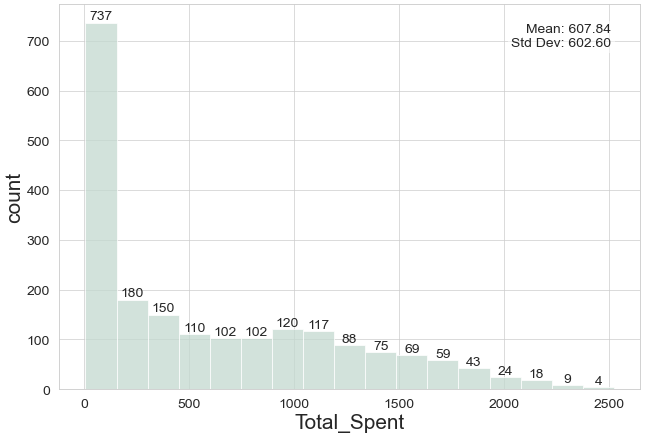

In [54]:
plt.figure(figsize=(15,10), dpi=50)
ax = sns.histplot(x="Total_Spent", data=df_continuous, color='#c4d9cf')

mean_val = df_continuous['Total_Spent'].mean()
std_val = df_continuous['Total_Spent'].std()

plt.text(x=0.95, y=0.95, 
         s=f'Mean: {mean_val:.2f}\nStd Dev: {std_val:.2f}', 
         transform=ax.transAxes, 
         horizontalalignment='right', verticalalignment='top', 
         fontsize=20, bbox=dict(facecolor='white', alpha=0.5))
         
plt.xlabel("Total_Spent", fontsize=30)
plt.ylabel("count", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

for p in ax.patches:
    ax.annotate('{:.0f}'.format(p.get_height()),(p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom', fontsize=20) 

In [55]:
top_spenders = df_continuous[['Income', 'Total_Spent']].sort_values(by='Total_Spent', ascending=False).head(130)
top_spenders

,Income,Total_Spent
1179,90638.0,2525
1492,87679.0,2524
987,75759.0,2486
1052,69098.0,2440
1601,90226.0,2352
...,...,...
161,70356.0,1706
1887,86979.0,1702
2160,60896.0,1701
1699,73705.0,1695


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.2 |</span><span style='color:black'> Which products contribute most to sales, and which products are less popular?  </span></b>

<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

<h2 align="left"><font color=#524712>Note:</font></h2>
    
   - To understand this, we need to know what percentage of total sales over the past 2 years was contributed by each product, such as mntwines, mntfruits, and so on
     

In [56]:
product_columns = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']

In [57]:
total_sales = df_continuous[product_columns].sum()

In [58]:
total_sales 

MntWines            612392
MntFruits            52977
MntMeatProducts     336973
MntFishProducts      75370
MntSweetProducts     54680
MntGoldProds         87537
dtype: int64

In [59]:
total_sales.sum()

1219929

In [60]:
total_sales_percentage = (total_sales / total_sales.sum()) * 100

total_sales_percentage

MntWines            50.198987
MntFruits            4.342630
MntMeatProducts     27.622345
MntFishProducts      6.178228
MntSweetProducts     4.482228
MntGoldProds         7.175582
dtype: float64

Share of products in total sales:
MntWines            50.198987
MntFruits            4.342630
MntMeatProducts     27.622345
MntFishProducts      6.178228
MntSweetProducts     4.482228
MntGoldProds         7.175582
dtype: float64


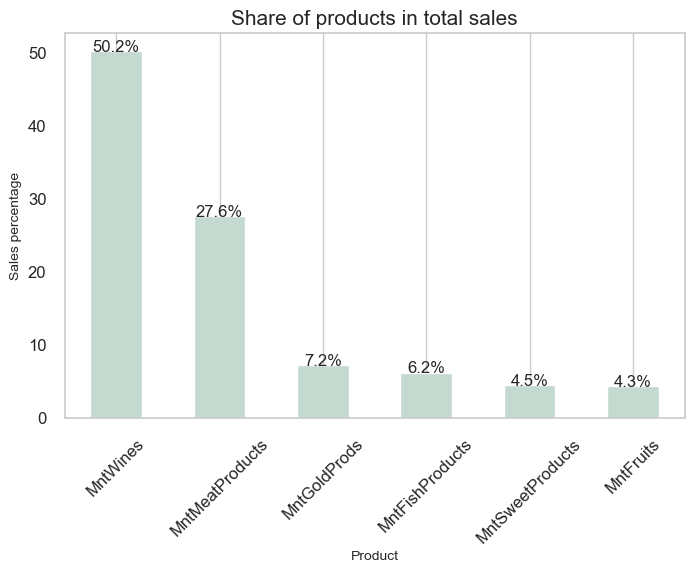

In [61]:
product_columns = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']

total_sales = df_continuous[product_columns].sum()

total_sales_percentage = (total_sales / total_sales.sum()) * 100


print("Share of products in total sales:")
print(total_sales_percentage)

total_sales_percentage_sorted = total_sales_percentage.sort_values(ascending=False)

plt.figure(figsize=(8, 5))
ax = total_sales_percentage_sorted.plot(kind='bar', color='#c4d9cf')

plt.title("Share of products in total sales", fontsize=15)
plt.xlabel("Product", fontsize=10)
plt.ylabel("Sales percentage", fontsize=10)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline', fontsize=12)

plt.grid(axis='y')
plt.show()


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.3 |</span><span style='color:black'> What factors drive customers to make repeat purchases?  </span></b>

In [62]:
df_continuous['Total_Purchases'] = df_categorical['Total_Purchases']

correlation_matrix = df_continuous.corr()
print(correlation_matrix['Total_Purchases'].sort_values(ascending=False))

Total_Purchases         1.000000
Total_Spent             0.751222
Avg_Monthly_Purchase    0.751222
MntWines                0.705330
Income                  0.656128
MntMeatProducts         0.558141
MntGoldProds            0.485551
MntFishProducts         0.465764
MntSweetProducts        0.462915
MntFruits               0.448153
Age                     0.169397
Recency                 0.001277
Name: Total_Purchases, dtype: float64


In [63]:
correlation_matrix = df_categorical.corr()
print(correlation_matrix['Total_Purchases'].sort_values(ascending=False))

Total_Purchases               1.000000
NumStorePurchases             0.812378
NumWebPurchases               0.766144
NumCatalogPurchases           0.731960
NumDealsPurchases             0.358042
Acceptance_Rate_Cmp           0.255928
AcceptedCmp1                  0.223072
AcceptedCmp5                  0.214128
AcceptedCmp4                  0.188315
Response                      0.144295
Teenhome                      0.112530
AcceptedCmp2                  0.079376
Education_PhD                 0.058255
Education_Graduation          0.026538
Marital_Status_new_Partner    0.019185
AcceptedCmp3                  0.014436
Education_Master              0.002293
Marital_Status_new_Single    -0.018504
Complain                     -0.020347
Education_Basic              -0.158779
Year                         -0.188331
NumWebVisitsMonth            -0.292945
Kidhome                      -0.475396
Name: Total_Purchases, dtype: float64


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.4 |</span><span style='color:black'>  Is there a correlation between customer income and their purchasing patterns?  </span></b>

In [64]:
correlation_matrix = df_continuous.corr()
print(correlation_matrix['Income'].sort_values(ascending=False))

Income                  1.000000
Total_Spent             0.785423
Avg_Monthly_Purchase    0.785423
MntMeatProducts         0.686034
MntWines                0.679576
Total_Purchases         0.656128
MntSweetProducts        0.516860
MntFishProducts         0.515279
MntFruits               0.501722
MntGoldProds            0.376875
Age                     0.203562
Recency                 0.004042
Name: Income, dtype: float64


In [65]:
df_categorical['Income'] = df_continuous['Income']

correlation_matrix = df_categorical.corr()
print(correlation_matrix['Income'].sort_values(ascending=False))

Income                        1.000000
NumCatalogPurchases           0.685684
Total_Purchases               0.656128
NumStorePurchases             0.616249
NumWebPurchases               0.440128
AcceptedCmp5                  0.391427
Acceptance_Rate_Cmp           0.359801
AcceptedCmp1                  0.326894
AcceptedCmp4                  0.210359
Response                      0.152092
AcceptedCmp2                  0.101820
Education_PhD                 0.097572
Teenhome                      0.024453
Education_Graduation          0.021999
Year                          0.021753
Education_Master              0.016665
Marital_Status_new_Partner    0.007088
Marital_Status_new_Single    -0.005818
AcceptedCmp3                 -0.019280
Complain                     -0.029466
NumDealsPurchases            -0.120027
Education_Basic              -0.237743
Kidhome                      -0.512550
NumWebVisitsMonth            -0.640969
Name: Income, dtype: float64


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.5 |</span><span style='color:black'> Are customers who visit the website more frequently more likely to make purchases?  </span></b>

In [66]:
df_continuous['NumWebVisitsMonth']=df_categorical['NumWebVisitsMonth']

correlation = df_continuous[['NumWebVisitsMonth', 'Total_Purchases']].corr()
print(correlation)

                   NumWebVisitsMonth  Total_Purchases
NumWebVisitsMonth           1.000000        -0.296411
Total_Purchases            -0.296411         1.000000


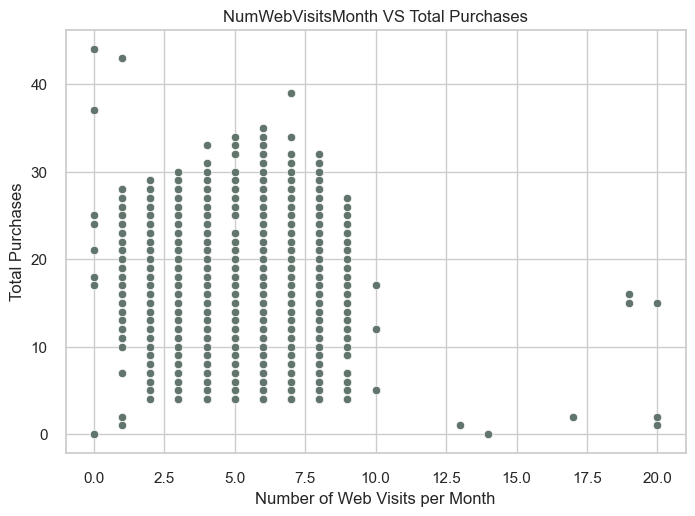

In [67]:
sns.scatterplot(x='NumWebVisitsMonth', y='Total_Purchases', data=df_continuous, color='#61756c')
plt.title("NumWebVisitsMonth VS Total Purchases")
plt.xlabel("Number of Web Visits per Month")
plt.ylabel("Total Purchases")
plt.show()

<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.6 |</span><span style='color:black'> What characteristics do customers who have accepted campaigns share?  </span></b>

In [68]:
df_categorical.iloc[:,6:]

,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Kidhome,Teenhome,Year,Marital_Status_new_Partner,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Total_Purchases,Acceptance_Rate_Cmp,Income
0,0,0,0,0,0,1,0,0,2012,0,1,0,1,0,0,25,0.0,58138.0
1,0,0,0,0,0,0,1,1,2014,0,1,0,1,0,0,6,0.0,46344.0
2,0,0,0,0,0,0,0,0,2013,1,0,0,1,0,0,21,0.0,71613.0
3,0,0,0,0,0,0,1,0,2014,1,0,0,1,0,0,8,0.0,26646.0
4,0,0,0,0,0,0,1,0,2014,1,0,0,0,0,1,19,0.0,58293.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2233,0,0,0,0,0,0,1,0,2013,1,0,0,1,0,0,11,0.0,NaN
2235,0,0,0,0,0,0,0,1,2013,1,0,0,1,0,0,18,0.0,61223.0
2237,1,0,0,0,0,0,0,0,2014,0,1,0,1,0,0,19,0.2,56981.0
2238,0,0,0,0,0,0,0,1,2014,1,0,0,0,1,0,23,0.0,69245.0


<Axes: >

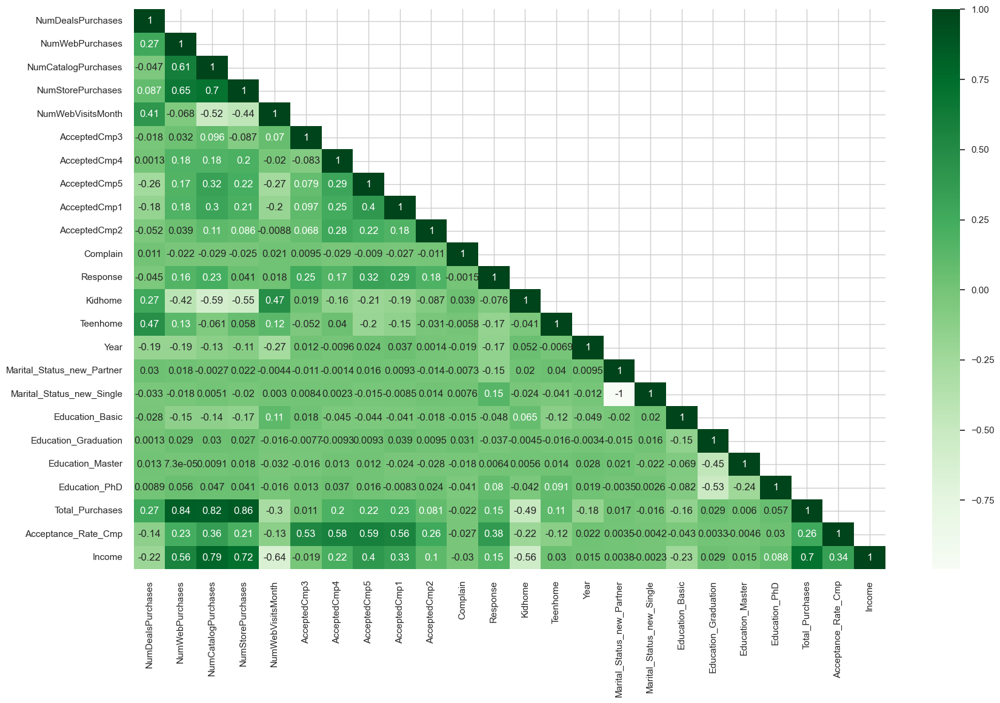

In [69]:
corr = df_categorical.corr(method="spearman")     
fig, ax = plt.subplots(figsize=(20, 12))

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask,1)] = True
sns.heatmap(corr, cmap='Greens' , mask=mask ,annot=True, ax=ax)

In [70]:
df_categorical.iloc[:,5:12].head(20)

,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1
9,1,0,0,0,0,0,0


In [71]:
df_categorical['Total_Accepted_Campaigns'] = df_categorical[['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2']].sum(axis=1)

df_categorical.loc[df_categorical['Total_Accepted_Campaigns'] == 0, 'Response'] = 0
df_categorical.loc[df_categorical['Total_Accepted_Campaigns'] > 0, 'Response'] = 1

df_categorical.drop('Total_Accepted_Campaigns', axis=1, inplace=True)

In [72]:
df_categorical.iloc[:,5:12].head(10)

,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0
9,1,0,0,0,0,0,1


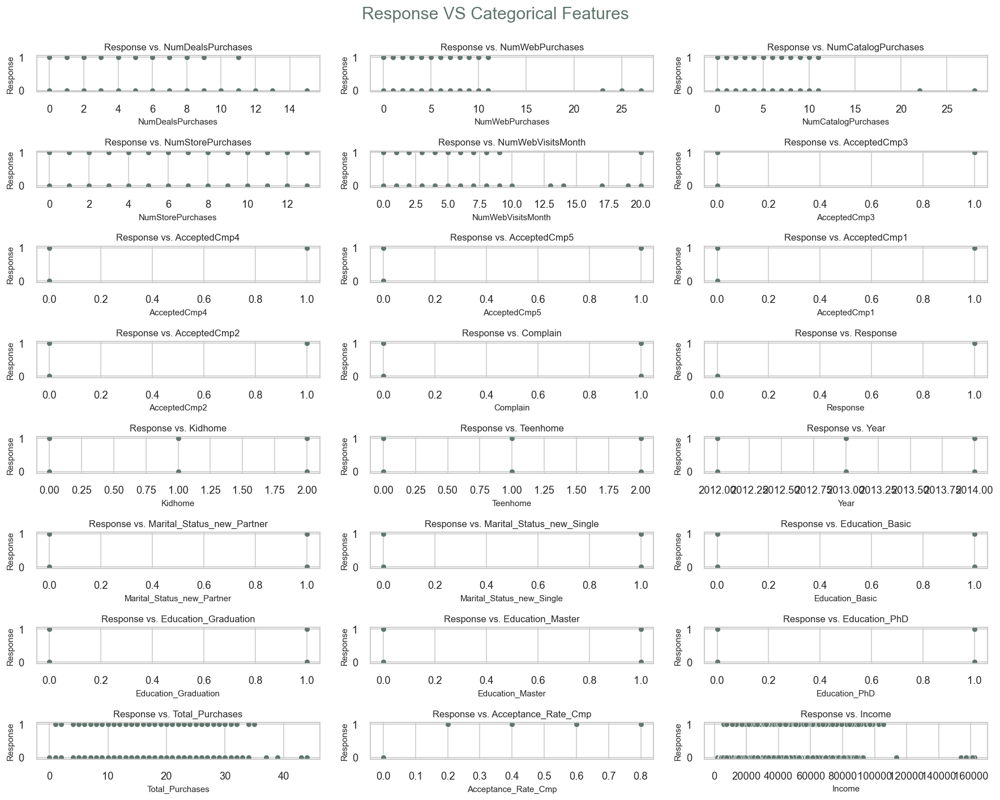

In [73]:
fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 12), dpi=120)

cat_features = df_categorical.columns

for i, feature in enumerate(cat_features):
    row = i // 3
    col = i % 3
    sns.scatterplot(ax=axes[row, col], x=feature, y='Response', data=df_categorical, color='#61756c')
    axes[row, col].set_title('{} vs. {}'.format('Response', feature), size=10)
    axes[row, col].set_xlabel(feature, size=9)
    axes[row, col].set_ylabel('Response', size=9)
    axes[row, col].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle('Response VS Categorical Features', size=18, color='#61756c')
plt.show()

In [74]:
df_continuous['Response']=df_categorical['Response']

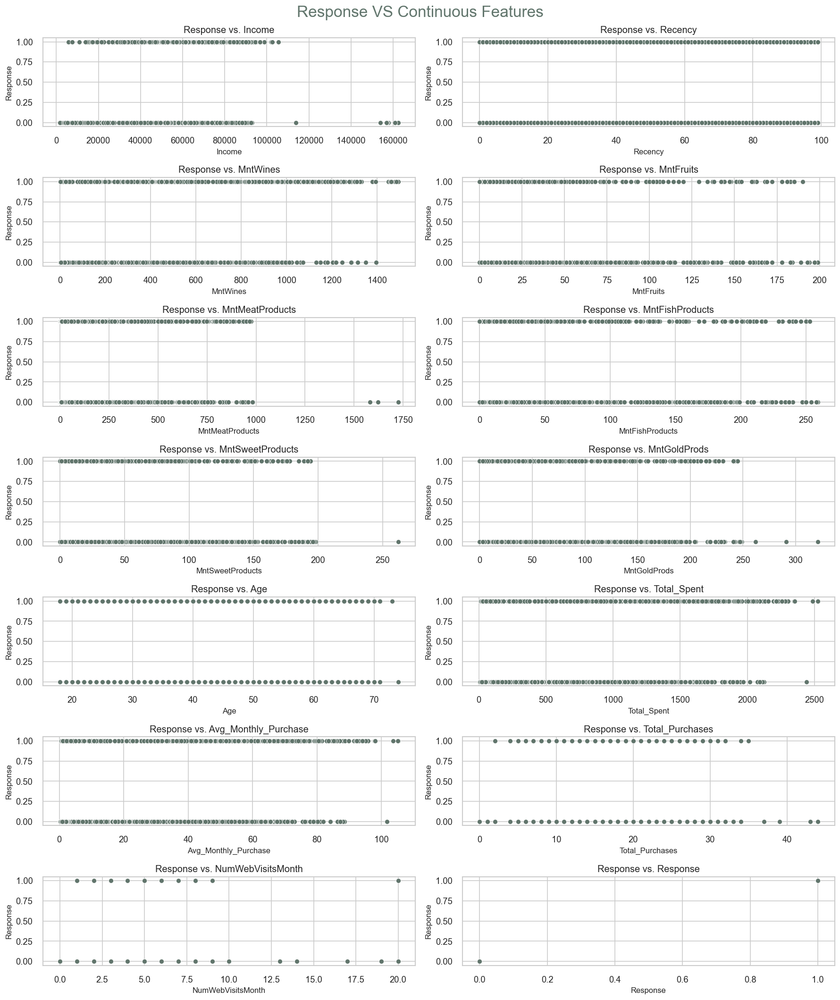

In [75]:
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(15, 18), dpi=120)

con_features = df_continuous.columns

for i, feature in enumerate(con_features):
    row = i // 2
    col = i % 2
    sns.scatterplot(ax=axes[row, col], x=feature, y='Response', data=df_continuous, color='#61756c')
    axes[row, col].set_title('{} vs. {}'.format('Response', feature), size=12)
    axes[row, col].set_xlabel(feature, size=10)
    axes[row, col].set_ylabel('Response', size=10)
    axes[row, col].grid(True)
    axes[row, col].tick_params(axis='x')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.suptitle('Response VS Continuous Features', size=20, color='#61756c')
plt.show()

<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.6 |</span><span style='color:black'> Are customers who have been successful in one campaign likely to accept subsequent ones?  </span></b>

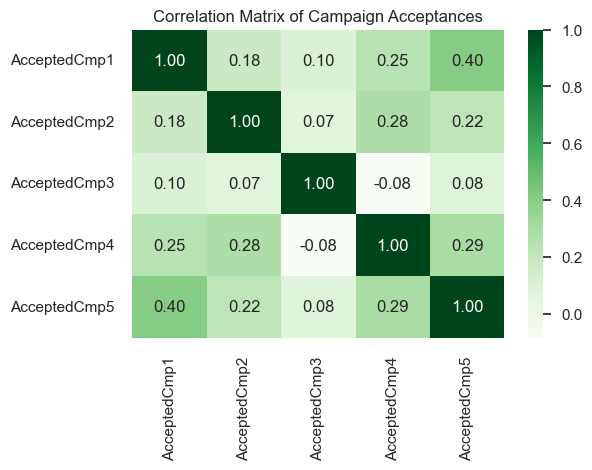

In [76]:
campaign_features = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']

correlation_matrix = df_categorical[campaign_features].corr()

plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens', fmt='.2f')
plt.title('Correlation Matrix of Campaign Acceptances')
plt.show()

<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.7 |</span><span style='color:black'> Do customers who purchase more frequently accept campaigns more often?  </span></b>

In [77]:
correlation_matrix = df_categorical.corr()
print(correlation_matrix['Total_Purchases'].sort_values(ascending=False))

Total_Purchases               1.000000
NumStorePurchases             0.812378
NumWebPurchases               0.766144
NumCatalogPurchases           0.731960
Income                        0.656128
NumDealsPurchases             0.358042
Acceptance_Rate_Cmp           0.255928
Response                      0.247136
AcceptedCmp1                  0.223072
AcceptedCmp5                  0.214128
AcceptedCmp4                  0.188315
Teenhome                      0.112530
AcceptedCmp2                  0.079376
Education_PhD                 0.058255
Education_Graduation          0.026538
Marital_Status_new_Partner    0.019185
AcceptedCmp3                  0.014436
Education_Master              0.002293
Marital_Status_new_Single    -0.018504
Complain                     -0.020347
Education_Basic              -0.158779
Year                         -0.188331
NumWebVisitsMonth            -0.292945
Kidhome                      -0.475396
Name: Total_Purchases, dtype: float64


<a id="removal"></a>
# <b><span style='color:#61756c'>Step 7.8 |</span><span style='color:black'> What factors cause customers to reject campaigns?  </span></b>

In [78]:
correlation_with_response = df_categorical.corr()['Response'].sort_values(ascending=False)

print(correlation_with_response)

Response                      1.000000
Acceptance_Rate_Cmp           0.859677
AcceptedCmp4                  0.559115
AcceptedCmp3                  0.545560
AcceptedCmp5                  0.539679
AcceptedCmp1                  0.513644
Income                        0.306215
NumCatalogPurchases           0.302753
Total_Purchases               0.247136
AcceptedCmp2                  0.219141
NumWebPurchases               0.202364
NumStorePurchases             0.187468
Education_PhD                 0.029536
Year                          0.020981
Marital_Status_new_Partner    0.003104
Education_Graduation          0.001903
Education_Master             -0.003171
Marital_Status_new_Single    -0.004007
Complain                     -0.027894
Education_Basic              -0.040648
NumDealsPurchases            -0.090899
Teenhome                     -0.104051
NumWebVisitsMonth            -0.116421
Kidhome                      -0.208528
Name: Response, dtype: float64


In [79]:
correlation_with_response = df_continuous.corr()['Response'].sort_values(ascending=False)

print(correlation_with_response)

Response                1.000000
MntWines                0.460150
Avg_Monthly_Purchase    0.404453
Total_Spent             0.404453
Income                  0.306215
MntMeatProducts         0.262008
Total_Purchases         0.248879
MntGoldProds            0.182145
MntFishProducts         0.149565
MntSweetProducts        0.148636
MntFruits               0.127892
Age                     0.008522
Recency                -0.020250
NumWebVisitsMonth      -0.111458
Name: Response, dtype: float64


<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 8: Deleting columns created in the analysis </p>

⬆️[Tabel of Contents](#contents_tabel)

In [80]:
df_categorical=df_categorical.drop(['Marital_Status_new_Partner','Income'],axis=1)

In [81]:
df_categorical.describe().T

,count,mean,std,min,25%,50%,75%,max
NumDealsPurchases,2012.0,2.359344,1.957936,0.0,1.0,2.0,3.0,15.0
NumWebPurchases,2012.0,4.151093,2.801583,0.0,2.0,4.0,6.0,27.0
NumCatalogPurchases,2012.0,2.710239,2.937275,0.0,1.0,2.0,4.0,28.0
NumStorePurchases,2012.0,5.829523,3.247807,0.0,3.0,5.0,8.0,13.0
NumWebVisitsMonth,2012.0,5.287276,2.443998,0.0,3.0,6.0,7.0,20.0
AcceptedCmp3,2012.0,0.075050,0.263537,0.0,0.0,0.0,0.0,1.0
AcceptedCmp4,2012.0,0.078529,0.269069,0.0,0.0,0.0,0.0,1.0
AcceptedCmp5,2012.0,0.073559,0.261116,0.0,0.0,0.0,0.0,1.0
AcceptedCmp1,2012.0,0.067097,0.250253,0.0,0.0,0.0,0.0,1.0
AcceptedCmp2,2012.0,0.012922,0.112968,0.0,0.0,0.0,0.0,1.0


In [82]:
df_continuous=df_continuous.drop(['Avg_Monthly_Purchase','NumWebVisitsMonth','Response','Total_Purchases'],axis=1)

In [83]:
df_continuous.describe()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age,Total_Spent
count,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000
mean,52057.044345,49.045341,305.128052,26.396114,167.898854,37.553563,27.244644,43.615845,45.121574,607.837070
std,21627.181179,28.950941,336.818060,39.811608,226.407249,54.787662,41.529740,51.490974,11.672379,602.595721
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,5.000000
25%,35482.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,37.000000,69.000000
50%,51537.000000,49.000000,176.000000,8.000000,68.000000,12.000000,8.000000,24.000000,44.000000,397.000000
75%,68641.000000,74.000000,505.000000,33.000000,230.000000,50.000000,34.000000,56.000000,55.000000,1047.500000
max,162397.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,74.000000,2525.000000


In [84]:
df_finaly = pd.concat([df_continuous, df_categorical], axis=1)

In [85]:
df_finaly=df_finaly.dropna()

In [86]:
df_finaly

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age,Total_Spent,...,Kidhome,Teenhome,Year,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Total_Purchases,Acceptance_Rate_Cmp
0,58138.0,58.0,635.0,88.0,546.0,172.0,88.0,88.0,57.0,1617.0,...,0.0,0.0,2012.0,1.0,0.0,1.0,0.0,0.0,25.0,0.0
1,46344.0,38.0,11.0,1.0,6.0,2.0,1.0,6.0,60.0,27.0,...,1.0,1.0,2014.0,1.0,0.0,1.0,0.0,0.0,6.0,0.0
2,71613.0,26.0,426.0,49.0,127.0,111.0,21.0,42.0,49.0,776.0,...,0.0,0.0,2013.0,0.0,0.0,1.0,0.0,0.0,21.0,0.0
3,26646.0,26.0,11.0,4.0,20.0,10.0,3.0,5.0,30.0,53.0,...,1.0,0.0,2014.0,0.0,0.0,1.0,0.0,0.0,8.0,0.0
4,58293.0,94.0,173.0,43.0,118.0,46.0,27.0,15.0,33.0,422.0,...,1.0,0.0,2014.0,0.0,0.0,0.0,0.0,1.0,19.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2232,26816.0,50.0,5.0,1.0,6.0,3.0,4.0,3.0,28.0,22.0,...,0.0,0.0,2012.0,1.0,0.0,1.0,0.0,0.0,4.0,0.0
2235,61223.0,46.0,709.0,43.0,182.0,42.0,118.0,247.0,47.0,1341.0,...,0.0,1.0,2013.0,0.0,0.0,1.0,0.0,0.0,18.0,0.0
2237,56981.0,91.0,908.0,48.0,217.0,32.0,12.0,24.0,33.0,1241.0,...,0.0,0.0,2014.0,1.0,0.0,1.0,0.0,0.0,19.0,0.2
2238,69245.0,8.0,428.0,30.0,214.0,80.0,30.0,61.0,58.0,843.0,...,0.0,1.0,2014.0,0.0,0.0,0.0,1.0,0.0,23.0,0.0


<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 9: Feature Scaling </p>

⬆️[Tabel of Contents](#contents_tabel)

In [87]:
scaler = StandardScaler()

df_finaly_scaled = pd.DataFrame(scaler.fit_transform(df_finaly), columns=df_finaly.columns)

df_finaly_scaled.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age,Total_Spent,...,Kidhome,Teenhome,Year,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Total_Purchases,Acceptance_Rate_Cmp
0,0.262639,0.303780,0.958781,1.533961,1.647587,2.433426,1.442692,0.842390,1.003664,1.653774,...,-0.808726,-0.941737,-1.498696,1.328454,-0.156621,0.998473,-0.446256,-0.528041,1.301551,-0.446659
1,-0.283231,-0.386764,-0.888141,-0.645465,-0.724400,-0.655717,-0.638995,-0.741733,1.260947,-0.980820,...,1.056760,0.884972,1.406924,1.328454,-0.156621,0.998473,-0.446256,-0.528041,-1.190566,-0.446659
2,0.886312,-0.801091,0.340181,0.556977,-0.192899,1.324969,-0.160447,-0.046264,0.317574,0.260256,...,-0.808726,-0.941737,-0.045886,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,0.776895,-0.446659
3,-1.194928,-0.801091,-0.888141,-0.570313,-0.662904,-0.510346,-0.591141,-0.761051,-1.311889,-0.937739,...,1.056760,-0.941737,1.406924,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,-0.928238,-0.446659
4,0.269813,1.546759,-0.408651,0.406672,-0.232433,0.143826,-0.016882,-0.567866,-1.054605,-0.326314,...,1.056760,-0.941737,1.406924,-0.752755,-0.156621,-1.001529,-0.446256,1.893792,0.514567,-0.446659


<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 10: Dimensionality Reduction (PCA) </p>

⬆️[Tabel of Contents](#contents_tabel)

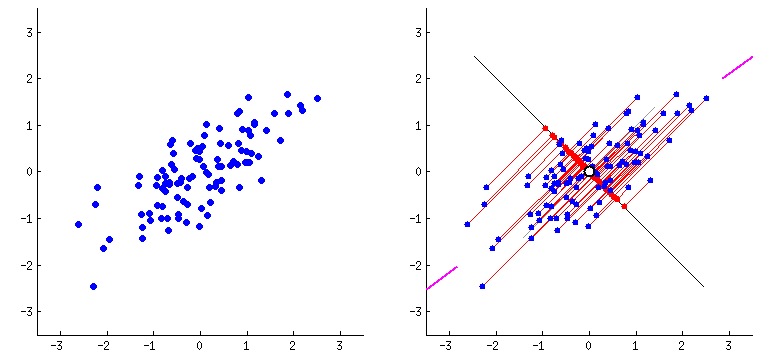

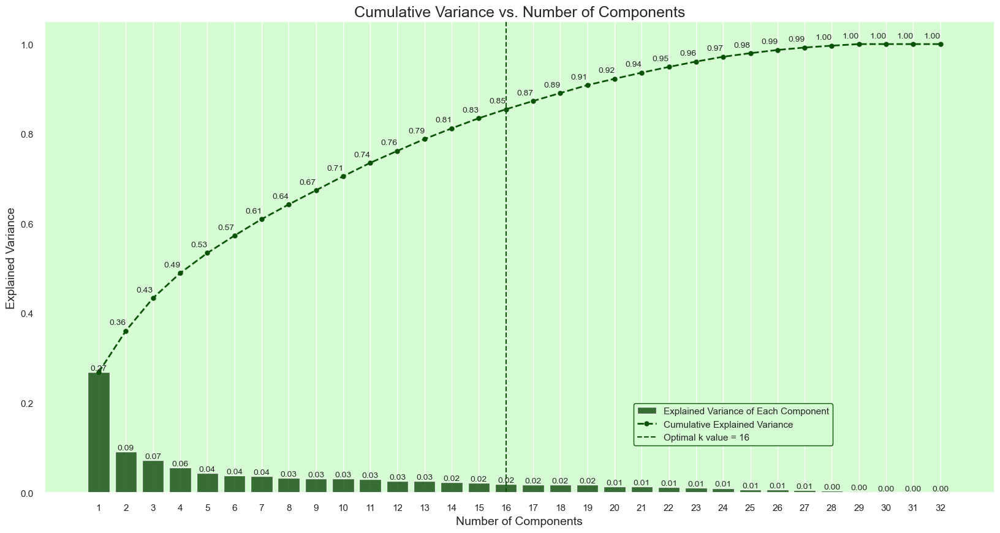

In [88]:
pca = PCA().fit(df_finaly_scaled)

explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

optimal_k = 16

sns.set(rc={'axes.facecolor': '#d6fcd4'}, style='darkgrid')

plt.figure(figsize=(20, 10))

barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)),
                      y=explained_variance_ratio,
                      color='#075203',
                      alpha=0.8)

lineplot, = plt.plot(range(0, len(cumulative_explained_variance)), cumulative_explained_variance,
                     marker='o', linestyle='--', color='#075203', linewidth=2)


optimal_k_line = plt.axvline(optimal_k - 1, color='#075203', linestyle='--', label=f'Optimal k value = {optimal_k}') 


plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)


plt.xticks(range(0, len(cumulative_explained_variance)))
plt.legend(handles=[barplot.patches[0], lineplot, optimal_k_line],
           labels=['Explained Variance of Each Component', 'Cumulative Explained Variance', f'Optimal k value = {optimal_k}'],
           loc=(0.62, 0.1),
           frameon=True,
           framealpha=1.0,  
           edgecolor='#075203')  


x_offset = -0.3
y_offset = 0.01
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
    if i > 0:
        plt.text(i + x_offset, cum_ev_ratio + y_offset, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')   
plt.show()

In [89]:
pca = PCA(n_components=19)

customer_data_pca = pca.fit_transform(df_finaly_scaled)

customer_data_pca = pd.DataFrame(customer_data_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

customer_data_pca.index = df_finaly_scaled.index

In [90]:
customer_data_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19
0,3.725404,-2.525332,-0.515719,1.918904,-0.776314,-0.509365,-0.431520,1.217793,0.582599,0.540719,0.672089,-0.932573,-0.607608,0.992882,-0.167871,0.870559,-0.816686,1.360331,0.552046
1,-2.915099,0.136046,-0.576106,-0.429941,2.191348,0.052739,0.622390,1.066344,0.126756,-0.128004,0.785695,0.620291,-0.426586,1.029737,-0.345381,0.079927,0.229243,0.311624,0.394003
2,1.555501,-1.560143,-0.592469,0.413737,0.653415,-0.004566,-0.088695,-0.088241,-0.562425,-1.132655,-0.477974,-0.373498,0.176379,-1.224716,0.332956,-0.120289,-0.989214,0.094919,0.692389
3,-3.019956,0.500084,-1.553275,0.610403,0.629138,-0.014226,-0.089997,-1.235898,-0.673998,-1.005448,0.424806,0.615372,0.367948,-0.573552,-0.023404,-0.116373,-0.282387,0.296250,0.244058
4,-0.574210,-0.619619,0.280995,-0.937435,-0.948086,-1.405032,-0.111233,-2.277999,-0.201653,1.099932,0.506439,1.675399,0.794054,0.025213,0.806880,0.505948,-0.078015,0.517163,0.297294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1958,-2.796109,0.329769,-1.986572,0.738647,0.112738,-0.581819,-0.924427,1.077165,0.522908,0.083900,0.791690,-1.090828,-0.110195,-0.765484,-0.810941,-0.347019,-0.101340,-1.128703,-1.048104
1959,2.374824,-1.986844,0.294333,1.713905,0.524348,0.178519,0.636781,0.469003,-0.768290,0.029741,-0.878121,-0.658161,0.554440,-0.457337,1.388223,-1.659746,1.540482,1.149969,-0.196226
1960,2.325506,2.035247,-0.126256,0.266929,1.373391,-0.239531,-1.726583,0.585415,0.406749,1.110404,0.767277,1.622163,-0.036867,-3.093301,-0.585690,1.619535,-0.387652,0.492246,-0.673423
1961,1.672638,-1.647227,0.688639,-2.036320,0.154684,2.520800,0.745832,0.088191,-0.624405,-1.299392,-0.382690,0.529737,0.554526,-0.090506,0.090471,-0.136685,-0.282144,0.118539,0.115612


<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 11: K-Means Clustering </p>

⬆️[Tabel of Contents](#contents_tabel)

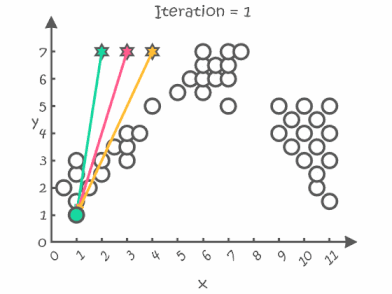

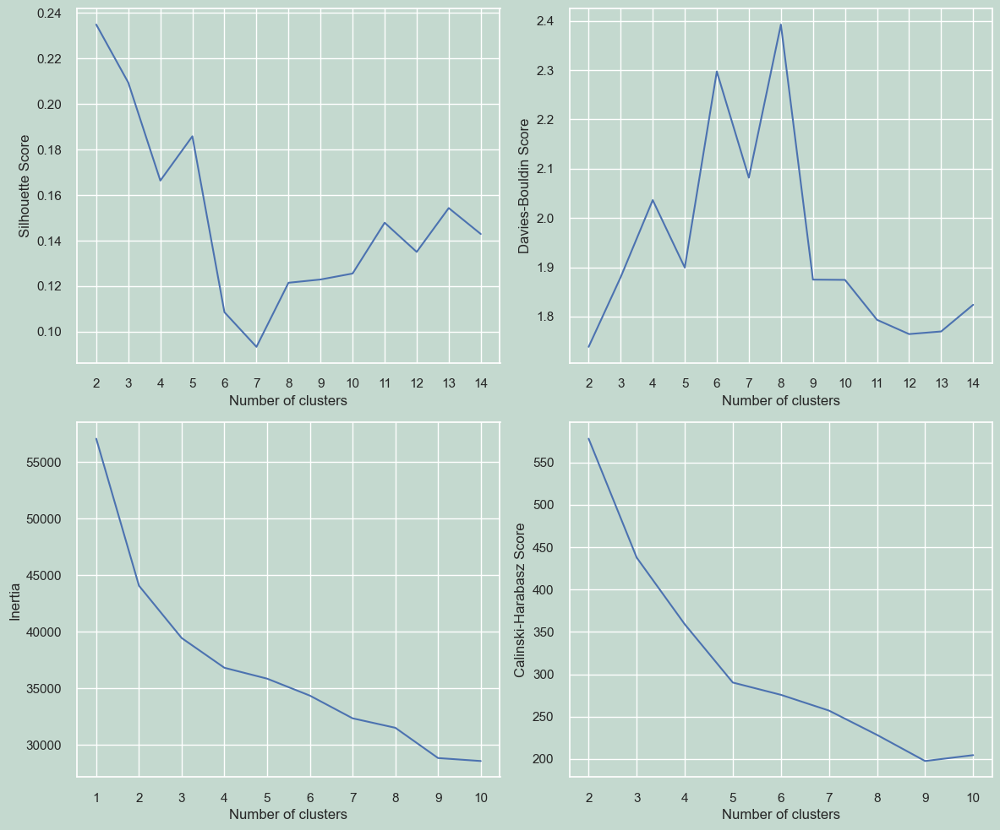

In [91]:
plt.rcParams['axes.facecolor'] = '#c4d9cf'
plt.rcParams['figure.facecolor'] = '#c4d9cf'

fig, axs = plt.subplots(2, 2, figsize=(12, 10)) 
# Plot 1: Silhouette Score
silhouette_list = []
for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, init='k-means++')
    y_pred = kmeans.fit_predict(customer_data_pca)
    s = silhouette_score(customer_data_pca, y_pred)
    silhouette_list.append(s)

axs[0, 0].plot(range(2, 15), silhouette_list)
axs[0, 0].set_xticks(range(2, 15))
axs[0, 0].set_xlabel("Number of clusters")
axs[0, 0].set_ylabel("Silhouette Score")

# Plot 2: Davies-Bouldin Score
dbs_list = []
for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, init='k-means++')
    y_pred = kmeans.fit_predict(customer_data_pca)
    dbs = davies_bouldin_score(customer_data_pca, y_pred)
    dbs_list.append(dbs)

axs[0, 1].plot(range(2, 15), dbs_list)
axs[0, 1].set_xticks(range(2, 15))
axs[0, 1].set_xlabel("Number of clusters")
axs[0, 1].set_ylabel("Davies-Bouldin Score")

# Plot 3: Inertia
inertia_list = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++')
    kmeans.fit(customer_data_pca)
    inertia_list.append(kmeans.inertia_)

axs[1, 0].plot(range(1, 11), inertia_list)
axs[1, 0].set_xticks(range(1, 11))
axs[1, 0].set_xlabel("Number of clusters")
axs[1, 0].set_ylabel("Inertia")

# Plot 4: Calinski-Harabasz Score
ch_list = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++')
    y_pred = kmeans.fit_predict(customer_data_pca)
    ch_score = calinski_harabasz_score(customer_data_pca, y_pred)
    ch_list.append(ch_score)

axs[1, 1].plot(range(2, 11), ch_list)
axs[1, 1].set_xticks(range(2, 11))
axs[1, 1].set_xlabel("Number of clusters")
axs[1, 1].set_ylabel("Calinski-Harabasz Score")

plt.tight_layout()

plt.show()

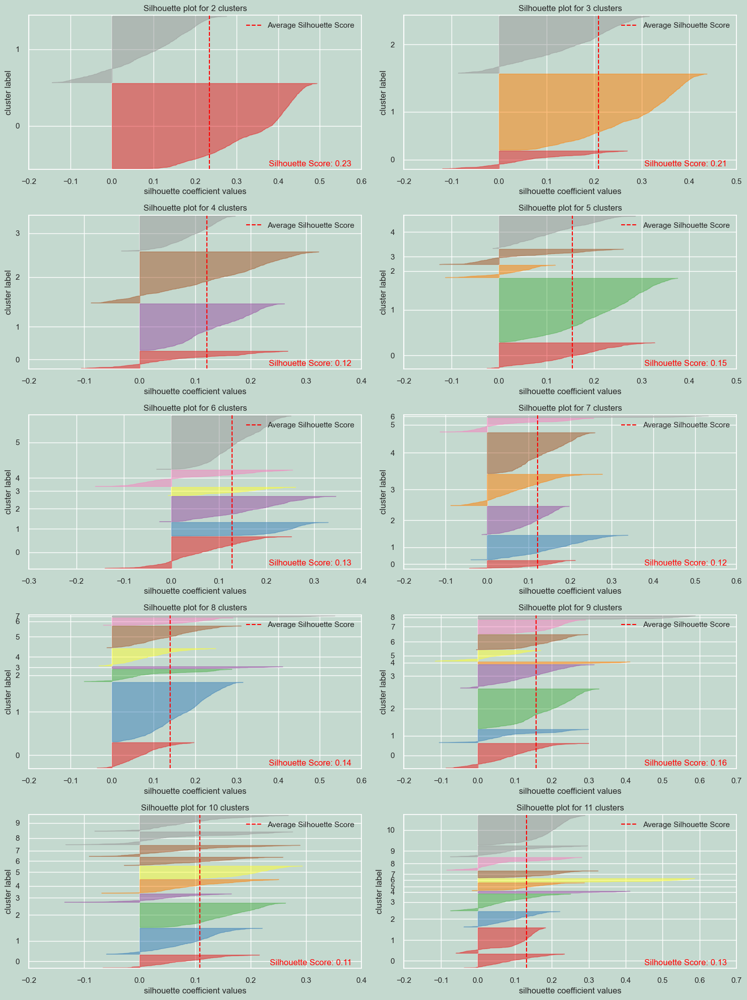

In [92]:
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
axes = axes.flatten()

for n_clusters in range(2, 12):
    ax = axes[n_clusters - 2]
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++')
    visualizer = SilhouetteVisualizer(kmeans, ax=ax)
    visualizer.fit(customer_data_pca)
    visualizer.finalize()
    ax.set_title(f'Silhouette plot for {n_clusters} clusters')
    score = silhouette_score(customer_data_pca, kmeans.labels_)
    ax.text(0.97, 0.02, f'Silhouette Score: {score:.2f}', fontsize=12, \
                ha='right', transform=ax.transAxes, color='red')
plt.tight_layout()
plt.show()

In [93]:
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, max_iter=100, random_state=0)
kmeans.fit(customer_data_pca)

labels = kmeans.labels_

df_finaly_scaled['cluster'] = labels

customer_data_pca['cluster'] = labels

In [94]:
Counter(labels).most_common()

[(1, 1105), (0, 858)]

In [95]:
customer_data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,cluster
0,3.725404,-2.525332,-0.515719,1.918904,-0.776314,-0.509365,-0.431520,1.217793,0.582599,0.540719,0.672089,-0.932573,-0.607608,0.992882,-0.167871,0.870559,-0.816686,1.360331,0.552046,0
1,-2.915099,0.136046,-0.576106,-0.429941,2.191348,0.052739,0.622390,1.066344,0.126756,-0.128004,0.785695,0.620291,-0.426586,1.029737,-0.345381,0.079927,0.229243,0.311624,0.394003,1
2,1.555501,-1.560143,-0.592469,0.413737,0.653415,-0.004566,-0.088695,-0.088241,-0.562425,-1.132655,-0.477974,-0.373498,0.176379,-1.224716,0.332956,-0.120289,-0.989214,0.094919,0.692389,0
3,-3.019956,0.500084,-1.553275,0.610403,0.629138,-0.014226,-0.089997,-1.235898,-0.673998,-1.005448,0.424806,0.615372,0.367948,-0.573552,-0.023404,-0.116373,-0.282387,0.296250,0.244058,1
4,-0.574210,-0.619619,0.280995,-0.937435,-0.948086,-1.405032,-0.111233,-2.277999,-0.201653,1.099932,0.506439,1.675399,0.794054,0.025213,0.806880,0.505948,-0.078015,0.517163,0.297294,1


In [96]:
df_finaly_scaled.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age,Total_Spent,...,Teenhome,Year,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Total_Purchases,Acceptance_Rate_Cmp,cluster
0,0.262639,0.303780,0.958781,1.533961,1.647587,2.433426,1.442692,0.842390,1.003664,1.653774,...,-0.941737,-1.498696,1.328454,-0.156621,0.998473,-0.446256,-0.528041,1.301551,-0.446659,0
1,-0.283231,-0.386764,-0.888141,-0.645465,-0.724400,-0.655717,-0.638995,-0.741733,1.260947,-0.980820,...,0.884972,1.406924,1.328454,-0.156621,0.998473,-0.446256,-0.528041,-1.190566,-0.446659,1
2,0.886312,-0.801091,0.340181,0.556977,-0.192899,1.324969,-0.160447,-0.046264,0.317574,0.260256,...,-0.941737,-0.045886,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,0.776895,-0.446659,0
3,-1.194928,-0.801091,-0.888141,-0.570313,-0.662904,-0.510346,-0.591141,-0.761051,-1.311889,-0.937739,...,-0.941737,1.406924,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,-0.928238,-0.446659,1
4,0.269813,1.546759,-0.408651,0.406672,-0.232433,0.143826,-0.016882,-0.567866,-1.054605,-0.326314,...,-0.941737,1.406924,-0.752755,-0.156621,-1.001529,-0.446256,1.893792,0.514567,-0.446659,1


In [97]:
colors = ['#e8000b', '#023eff','#1ac938']
cluster_0 = customer_data_pca[customer_data_pca['cluster'] == 0]
cluster_1 = customer_data_pca[customer_data_pca['cluster'] == 1]

# Create a 3D scatter plot
fig = go.Figure()

fig.add_trace(go.Scatter3d(x=cluster_0['PC1'], y=cluster_0['PC2'], z=cluster_0['PC3'], 
                           mode='markers', marker=dict(color=colors[1], size=5, opacity=0.4), name='Cluster 0'))
fig.add_trace(go.Scatter3d(x=cluster_1['PC1'], y=cluster_1['PC2'], z=cluster_1['PC3'], 
                           mode='markers', marker=dict(color=colors[2], size=5, opacity=0.4), name='Cluster 1'))

# Set the title and layout details
fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#c4d9cf", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#c4d9cf", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#c4d9cf", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

# Show the plot
fig.show()

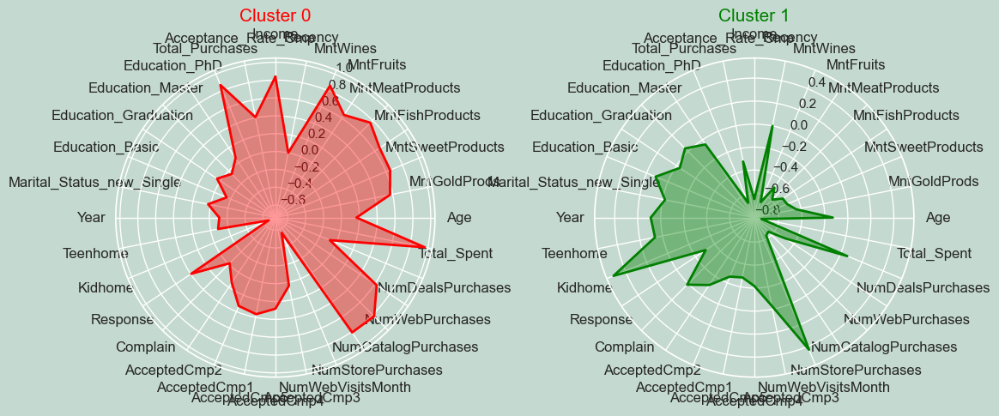

In [98]:
def prepare_cluster_data(df, cluster_label, features):
    
    return df[df['cluster'] == cluster_label][features].mean().tolist()

def plot_radar(ax, angles, data, title, color):
    data += data[:1]
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)
    ax.plot(angles, data, linewidth=2, linestyle='solid', color=color)
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, ha='center', va='center', fontsize=12)
    ax.set_title(title, color=color, size=15)

features = df_finaly_scaled.columns[:-1]

labels = features
n_vars = len(labels)
angles = [n / float(n_vars) * 2 * pi for n in range(n_vars)]
angles += angles[:1]

cluster_0_data = prepare_cluster_data(df_finaly_scaled, 0, features)
cluster_1_data = prepare_cluster_data(df_finaly_scaled, 1, features)

fig, ax = plt.subplots(1, 2, subplot_kw=dict(polar=True), figsize=(12, 6))
fig.subplots_adjust(wspace=0.5)

plot_radar(ax[0], angles, cluster_0_data, "Cluster 0", 'red')
plot_radar(ax[1], angles, cluster_1_data, "Cluster 1", 'green')

plt.show()

<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 11: DBSCAN Clustering </p>

⬆️[Tabel of Contents](#contents_tabel)

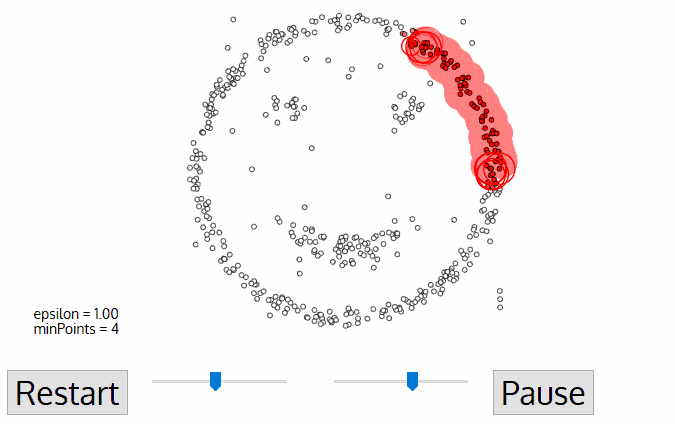

In [99]:
customer_data_pca = customer_data_pca.iloc[:,:19]

In [100]:
dbscan = DBSCAN(eps=4,min_samples=4)
y_pred = dbscan.fit_predict(customer_data_pca)

s = silhouette_score(customer_data_pca, y_pred)
dbs = davies_bouldin_score(customer_data_pca, y_pred)
ch_score = calinski_harabasz_score(customer_data_pca, y_pred)

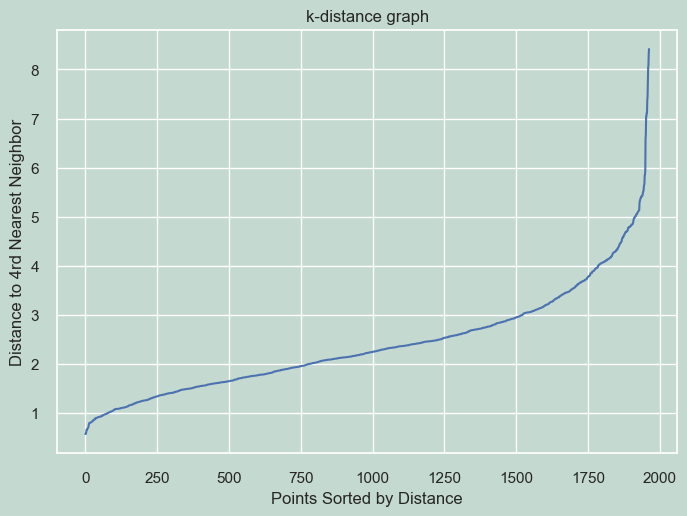

In [101]:
neighbors = NearestNeighbors(n_neighbors=4)
neighbors_fit = neighbors.fit(customer_data_pca)
distances, indices = neighbors_fit.kneighbors(customer_data_pca)

distances = np.sort(distances[:, 3])
plt.plot(distances)
plt.ylabel('Distance to 4rd Nearest Neighbor')
plt.xlabel('Points Sorted by Distance')
plt.title('k-distance graph')
plt.show()

In [102]:
print("silhouette_score:",s,'\n','davies_bouldin_score:',dbs,'\n','calinski_harabasz_score:',ch_score)

silhouette_score: 0.15907271832791461 
 davies_bouldin_score: 1.9007581293179465 
 calinski_harabasz_score: 72.04664324310095


In [103]:
labels=dbscan.labels_

customer_data_pca['Cluster'] = labels

In [104]:
customer_data_pca.describe().iloc[:,18:]

,PC19,Cluster
count,1.963000e+03,1963.000000
mean,3.619678e-18,0.687213
std,7.517089e-01,1.879655
min,-3.511050e+00,-1.000000
25%,-3.969906e-01,0.000000
50%,2.336341e-02,0.000000
75%,3.957774e-01,0.000000
max,4.600518e+00,11.000000


In [105]:
import plotly.graph_objects as go

colors = ['#e8000b', '#023eff', '#1ac938', '#e6c56f', '#00ced1','#dc143c', '#ffd700', '#ff69b4', '#8a2be2', '#7fff00','black']

cluster_0 = customer_data_pca[customer_data_pca['Cluster'] == 0]
cluster_1 = customer_data_pca[customer_data_pca['Cluster'] == 1]
cluster_2 = customer_data_pca[customer_data_pca['Cluster'] == 2]
cluster_3 = customer_data_pca[customer_data_pca['Cluster'] == 3]
cluster_4 = customer_data_pca[customer_data_pca['Cluster'] == 4]
cluster_5 = customer_data_pca[customer_data_pca['Cluster'] == 5]
cluster_6 = customer_data_pca[customer_data_pca['Cluster'] == 6]
cluster_7 = customer_data_pca[customer_data_pca['Cluster'] == 7]
cluster_8 = customer_data_pca[customer_data_pca['Cluster'] == 8]
cluster_9 = customer_data_pca[customer_data_pca['Cluster'] == 9]
cluster_10 = customer_data_pca[customer_data_pca['Cluster'] == 10]

fig = go.Figure()

for i in range(11):
    fig.add_trace(go.Scatter3d(
        x=customer_data_pca[customer_data_pca['Cluster'] == i]['PC1'], 
        y=customer_data_pca[customer_data_pca['Cluster'] == i]['PC2'], 
        z=customer_data_pca[customer_data_pca['Cluster'] == i]['PC3'], 
        mode='markers', 
        marker=dict(color=colors[i], size=5, opacity=0.4), 
        name=f'Cluster {i}'
    ))

fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#c4d9cf", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#c4d9cf", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#c4d9cf", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

fig.show()

<a id="eda"></a>
# <p style="background-color:#c4d9cf; font-family:calibri; font-size:130%; color:black; text-align:center; border-radius:40px 50px; padding:10px">Step 12: Recommendation System </p>

⬆️[Tabel of Contents](#contents_tabel)

In [106]:
df_finaly_scaled

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age,Total_Spent,...,Teenhome,Year,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Total_Purchases,Acceptance_Rate_Cmp,cluster
0,0.262639,0.303780,0.958781,1.533961,1.647587,2.433426,1.442692,0.842390,1.003664,1.653774,...,-0.941737,-1.498696,1.328454,-0.156621,0.998473,-0.446256,-0.528041,1.301551,-0.446659,0
1,-0.283231,-0.386764,-0.888141,-0.645465,-0.724400,-0.655717,-0.638995,-0.741733,1.260947,-0.980820,...,0.884972,1.406924,1.328454,-0.156621,0.998473,-0.446256,-0.528041,-1.190566,-0.446659,1
2,0.886312,-0.801091,0.340181,0.556977,-0.192899,1.324969,-0.160447,-0.046264,0.317574,0.260256,...,-0.941737,-0.045886,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,0.776895,-0.446659,0
3,-1.194928,-0.801091,-0.888141,-0.570313,-0.662904,-0.510346,-0.591141,-0.761051,-1.311889,-0.937739,...,-0.941737,1.406924,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,-0.928238,-0.446659,1
4,0.269813,1.546759,-0.408651,0.406672,-0.232433,0.143826,-0.016882,-0.567866,-1.054605,-0.326314,...,-0.941737,1.406924,-0.752755,-0.156621,-1.001529,-0.446256,1.893792,0.514567,-0.446659,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1958,-1.187059,0.027562,-0.905900,-0.645465,-0.724400,-0.637546,-0.567213,-0.799689,-1.483411,-0.989105,...,-0.941737,-1.498696,1.328454,-0.156621,0.998473,-0.446256,-0.528041,-1.452894,-0.446659,1
1959,0.405424,-0.110547,1.177807,0.406672,0.048692,0.071140,2.160515,3.914044,0.146052,1.196448,...,0.884972,-0.045886,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,0.383402,-0.446659,0
1960,0.209089,1.443177,1.766810,0.531926,0.202432,-0.110575,-0.375794,-0.393999,-1.054605,1.030750,...,-0.941737,1.406924,1.328454,-0.156621,0.998473,-0.446256,-0.528041,0.514567,1.009805,0
1961,0.776712,-1.422580,0.346100,0.081010,0.189254,0.761654,0.054900,0.320789,1.089425,0.371274,...,0.884972,1.406924,-0.752755,-0.156621,-1.001529,2.240864,-0.528041,1.039223,-0.446659,0


In [107]:
df_finaly_scaled.insert(0,"ID",cleaned_ids)

In [118]:
df_finaly_scaled

,ID,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Age,...,Teenhome,Year,Marital_Status_new_Single,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Total_Purchases,Acceptance_Rate_Cmp,cluster
0,5524,0.262639,0.303780,0.958781,1.533961,1.647587,2.433426,1.442692,0.842390,1.003664,...,-0.941737,-1.498696,1.328454,-0.156621,0.998473,-0.446256,-0.528041,1.301551,-0.446659,0
1,2174,-0.283231,-0.386764,-0.888141,-0.645465,-0.724400,-0.655717,-0.638995,-0.741733,1.260947,...,0.884972,1.406924,1.328454,-0.156621,0.998473,-0.446256,-0.528041,-1.190566,-0.446659,1
2,4141,0.886312,-0.801091,0.340181,0.556977,-0.192899,1.324969,-0.160447,-0.046264,0.317574,...,-0.941737,-0.045886,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,0.776895,-0.446659,0
3,6182,-1.194928,-0.801091,-0.888141,-0.570313,-0.662904,-0.510346,-0.591141,-0.761051,-1.311889,...,-0.941737,1.406924,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,-0.928238,-0.446659,1
4,5324,0.269813,1.546759,-0.408651,0.406672,-0.232433,0.143826,-0.016882,-0.567866,-1.054605,...,-0.941737,1.406924,-0.752755,-0.156621,-1.001529,-0.446256,1.893792,0.514567,-0.446659,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1958,1772,-1.187059,0.027562,-0.905900,-0.645465,-0.724400,-0.637546,-0.567213,-0.799689,-1.483411,...,-0.941737,-1.498696,1.328454,-0.156621,0.998473,-0.446256,-0.528041,-1.452894,-0.446659,1
1959,1544,0.405424,-0.110547,1.177807,0.406672,0.048692,0.071140,2.160515,3.914044,0.146052,...,0.884972,-0.045886,-0.752755,-0.156621,0.998473,-0.446256,-0.528041,0.383402,-0.446659,0
1960,4377,0.209089,1.443177,1.766810,0.531926,0.202432,-0.110575,-0.375794,-0.393999,-1.054605,...,-0.941737,1.406924,1.328454,-0.156621,0.998473,-0.446256,-0.528041,0.514567,1.009805,0
1961,1321,0.776712,-1.422580,0.346100,0.081010,0.189254,0.761654,0.054900,0.320789,1.089425,...,0.884972,1.406924,-0.752755,-0.156621,-1.001529,2.240864,-0.528041,1.039223,-0.446659,0


In [121]:
product_columns = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
cluster_summary = df_finaly_scaled.groupby('cluster')[features].mean()


def recommend_products(customer_id, df, cluster_summary):
    
    cluster = df.loc[df['ID'] == customer_id, 'cluster'].values[0]
     
    recommendations = cluster_summary.loc[cluster].sort_values(ascending=False)
    
    filtered_recommendations = [product for product in recommendations.index if product in product_columns]
    
    return filtered_recommendations[:5]


customer_id = 8858
top_products = recommend_products(customer_id, df_finaly_scaled, cluster_summary)
print(f"Top recommended products for customer {customer_id}: {top_products}")

Top recommended products for customer 8858: ['MntGoldProds', 'MntFruits', 'MntSweetProducts', 'MntFishProducts', 'MntMeatProducts']


<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

* Through my efforts on this project, I've discovered that, given our dataset and its characteristics, the K-means algorithm with 2 clusters outperforms other models. Therefore, our final model is K-means.
Based on this clustering, I've built a recommendation system that suggests products to each customer based on their specific attributes. 


<div style="border-radius:10px; padding: 15px; background-color: #c4d9cf; font-size:110%; text-align:left">

* **Thank you for taking the time to consider this matter**
* The programmer of this project: **Amir Salmasi**

<h2 align="left"><font color=#524712>Best Regards🙏</font></h2>